## CREDIT SUISSE GROUP AG (CS) - SNP500 - FTSE100

INSIGHTS INTO THE UK AND US ECONOMIES USING MACHINE LEARNING TECHNIQUES SUCH AS LINEAR REGRESSION AND NEURAL NETWORKS, BASED ON STOCK MARKET DATA.

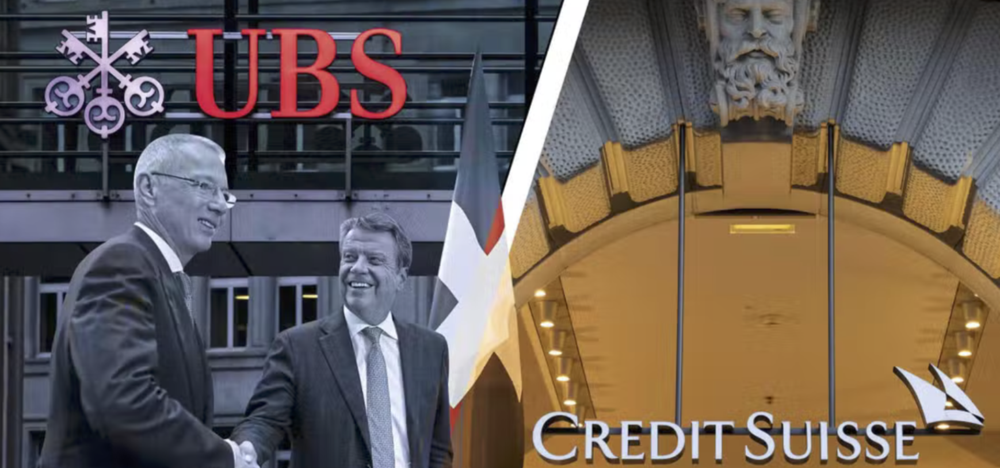

#### Hemant Thapa

### 1. CREDIT SUISSE BACKGROUND

Credit Suisse is a Swiss multinational investment bank and financial services company that was founded in 1856. The company has a long history of providing banking and financial services to individuals, corporations, and governments around the world.

In recent years, Credit Suisse has been facing significant financial problems, which have put pressure on the global banking system. One of the key issues has been the recent takeover of Credit Suisse by its larger rival UBS, which resulted in the investment of bondholders being wiped out. The bondholders who owned about $17 billion of risky Credit Suisse debt were left with nothing after the takeover.

The problem at Credit Suisse centers around the hierarchy of who should lose out first when a bank struggles. On one hand, investors who bought risky AT1 bonds (Additional Tier 1 bank debt) should expect to lose money when a bank runs into trouble. However, there are questions because Credit Suisse’s shareholders will not be wiped out completely but are set to be compensated in the emergency takeover with UBS shares worth the equivalent of Sfr 0.76 (£0.67) a share.

AT1 bonds, also known as Additional Tier 1 bonds, are a type of debt instrument issued by banks to raise capital. They are hybrid securities that combine characteristics of both bonds and equity, and are designed to increase the safety buffers of banks in times of financial stress. If a bank's capital levels fall below a certain level, the AT1 bonds can be converted into equity, which helps to reduce the bank's debts and increase its capitalization. These bonds were introduced after the 2008 financial crisis as a way to "bail in" failing banks, by imposing losses on investors rather than relying on taxpayer-funded bailouts. As a result, AT1 bonds are considered riskier than other types of debt, and investors are typically offered a higher return to compensate for this risk.

In [147]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import lxml
import appdirs
import pytz
import frozendict
from bs4 import BeautifulSoup
import html5lib
import pandas_datareader as pdr
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense
import torch
import xgboost as xgb
import string
import ta
import warnings
from typing import List
warnings.filterwarnings("ignore")

To assess the financial stability of companies like Credit Suisse, we can perform various analyses using tools like Python. For example, we can use Python to perform a financial ratio analysis, which would involve calculating various ratios such as the debt-to-equity ratio, the current ratio, and the return on equity. This analysis would give us a good understanding of the company's financial health and help us determine whether it is likely to face any financial problems in the future.

Another useful tool for predicting the financial stability of companies is machine learning algorithms. For example, we could use algorithms like decision trees, random forests, and neural networks to analyze the financial data of companies and make predictions about their future performance. These algorithms could be trained on historical financial data and used to identify patterns and trends in the data. This would allow us to make more informed decisions about investing in companies like Credit Suisse.

### 2. U.S MARKET 

The S&P 500 can have a significant impact on the global economy due to the sheer size and influence of the US economy, which is the largest in the world. The performance of the S&P 500 can affect not only the US economy but also other countries and regions that are closely tied to the US economy through trade, investment, and other forms of economic activity.

When the S&P 500 performs well, it can boost investor confidence and lead to increased investment in the US economy, which can, in turn, stimulate economic growth and job creation. A strong US economy can also increase demand for goods and services from other countries, thereby supporting economic growth around the world.

Conversely, when the S&P 500 performs poorly, it can have negative ripple effects on the global economy. A decline in the US stock market can reduce investor confidence and lead to a reduction in investment and economic activity, both in the US and in other countries that are closely tied to the US economy.

Moreover, the S&P 500 can serve as a bellwether for broader trends in the global economy. Changes in the index can reflect shifts in consumer behavior, changes in the regulatory environment, and other factors that can have far-reaching impacts on the global economy.

In [2]:
df = pd.read_csv('https://pkgstore.datahub.io/core/s-and-p-500-companies/constituents_csv/data/1beb8c524488247ccb27917bfcb581ec/constituents_csv.csv')
df.tail()

,Symbol,Name,Sector
500,YUM,Yum! Brands,Consumer Discretionary
501,ZBRA,Zebra Technologies,Information Technology
502,ZBH,Zimmer Biomet,Health Care
503,ZION,Zions Bancorp,Financials
504,ZTS,Zoetis,Health Care


In [3]:
df.to_csv('SNP500.csv')

In [4]:
df.columns = df.columns.str.lower()
companies = df.name.unique()
companies

array(['3M', 'A. O. Smith', 'Abbott Laboratories', 'AbbVie', 'Abiomed',
       'Accenture', 'Activision Blizzard', 'ADM', 'Adobe',
       'Advance Auto Parts', 'Advanced Micro Devices', 'AES Corp',
       'Aflac', 'Agilent Technologies', 'Air Products & Chemicals',
       'Akamai Technologies', 'Alaska Air Group', 'Albemarle Corporation',
       'Alexandria Real Estate Equities', 'Align Technology', 'Allegion',
       'Alliant Energy', 'Allstate Corp', 'Alphabet (Class A)',
       'Alphabet (Class C)', 'Altria Group', 'Amazon', 'Amcor',
       'Ameren Corp', 'American Airlines Group',
       'American Electric Power', 'American Express',
       'American International Group', 'American Tower',
       'American Water Works', 'Ameriprise Financial',
       'AmerisourceBergen', 'Ametek', 'Amgen', 'Amphenol',
       'Analog Devices', 'Ansys', 'Anthem', 'Aon', 'APA Corporation',
       'Apple', 'Applied Materials', 'Aptiv', 'Arista Networks',
       'Arthur J. Gallagher & Co.', 'Assurant', 

In [5]:
us_500 = []
ticker = df.symbol.unique()
for i in ticker:
    us_500.append(i)

In [6]:
us_500[:10]

['MMM', 'AOS', 'ABT', 'ABBV', 'ABMD', 'ACN', 'ATVI', 'ADM', 'ADBE', 'AAP']

In [7]:
# Load the data into a pandas DataFrame
us_price_data = yf.download(us_500, start="2023-03-13", end="2023-03-20")['Adj Close']
us_price_data.dropna(axis=1, inplace=True)

[*********************100%***********************]  505 of 505 completed

21 Failed downloads:
- VIAC: No timezone found, symbol may be delisted
- XLNX: No timezone found, symbol may be delisted
- WLTW: No timezone found, symbol may be delisted
- CTXS: No timezone found, symbol may be delisted
- BLL: No timezone found, symbol may be delisted
- ANTM: No timezone found, symbol may be delisted
- NLSN: No timezone found, symbol may be delisted
- NLOK: No timezone found, symbol may be delisted
- DRE: No timezone found, symbol may be delisted
- TWTR: No data found, symbol may be delisted
- CERN: No timezone found, symbol may be delisted
- FBHS: No timezone found, symbol may be delisted
- FB: No timezone found, symbol may be delisted
- ABMD: No data found for this date range, symbol may be delisted
- DISCK: No timezone found, symbol may be delisted
- BF.B: No data found for this date range, symbol may be delisted
- KSU: No timezone found, symbol may be delisted
- DISCA: No timezone found, sym

In [8]:
us_price_data.shape

(5, 484)

In [9]:
df_weekly = pd.DataFrame(data=us_price_data)
df_weekly.columns = df_weekly.columns.str.title()
df_weekly

,A,Aal,Aap,Aapl,Abbv,Abc,Abt,Acn,Adbe,Adi,...,Wynn,Xel,Xom,Xray,Xyl,Yum,Zbh,Zbra,Zion,Zts
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-13 00:00:00,136.690002,14.85,124.360001,150.470001,151.949997,148.369995,98.190002,251.309998,324.269989,182.550003,...,106.250000,64.780006,106.540001,37.549999,97.900002,124.889999,124.250000,284.920013,29.969999,163.410004
2023-03-14 00:00:00,138.399994,14.66,121.699997,152.589996,153.850006,149.289993,98.550003,252.479996,333.329987,186.580002,...,108.330002,65.440002,106.940002,38.130001,99.900002,126.699997,126.629997,292.459991,31.309999,164.559998
2023-03-15 00:00:00,134.029999,13.86,121.769997,152.990005,154.059998,149.610001,97.800003,246.169998,333.609985,182.929993,...,104.860001,67.309998,101.620003,37.209999,96.550003,127.129997,125.260002,287.739990,30.709999,163.570007
2023-03-16 00:00:00,136.820007,14.12,122.029999,155.850006,155.300003,152.050003,99.029999,252.919998,353.290009,186.630005,...,107.440002,67.239998,101.029999,37.439999,97.160004,128.059998,125.430000,294.929993,32.110001,166.309998
2023-03-17 00:00:00,133.179993,13.98,119.400002,155.000000,154.220001,152.020004,97.010002,250.000000,358.140015,185.850006,...,107.040001,66.879997,99.839996,36.880001,94.730003,126.849998,124.309998,288.709991,29.940001,164.470001


### ONE WEEK STOCK PRICE CORRELATION ANALYSIS AMONG TOP 20 US COMPANIES

In [10]:
# Compute the correlation matrix
corr_matrix = us_price_data.corr()

# Find the top 20 most correlated pairs of companies
corr_pairs = corr_matrix.unstack().sort_values(ascending=False)
corr_pairs = corr_pairs[corr_pairs != 1].drop_duplicates()[:20]
corr_pairs = pd.DataFrame(corr_pairs).reset_index()

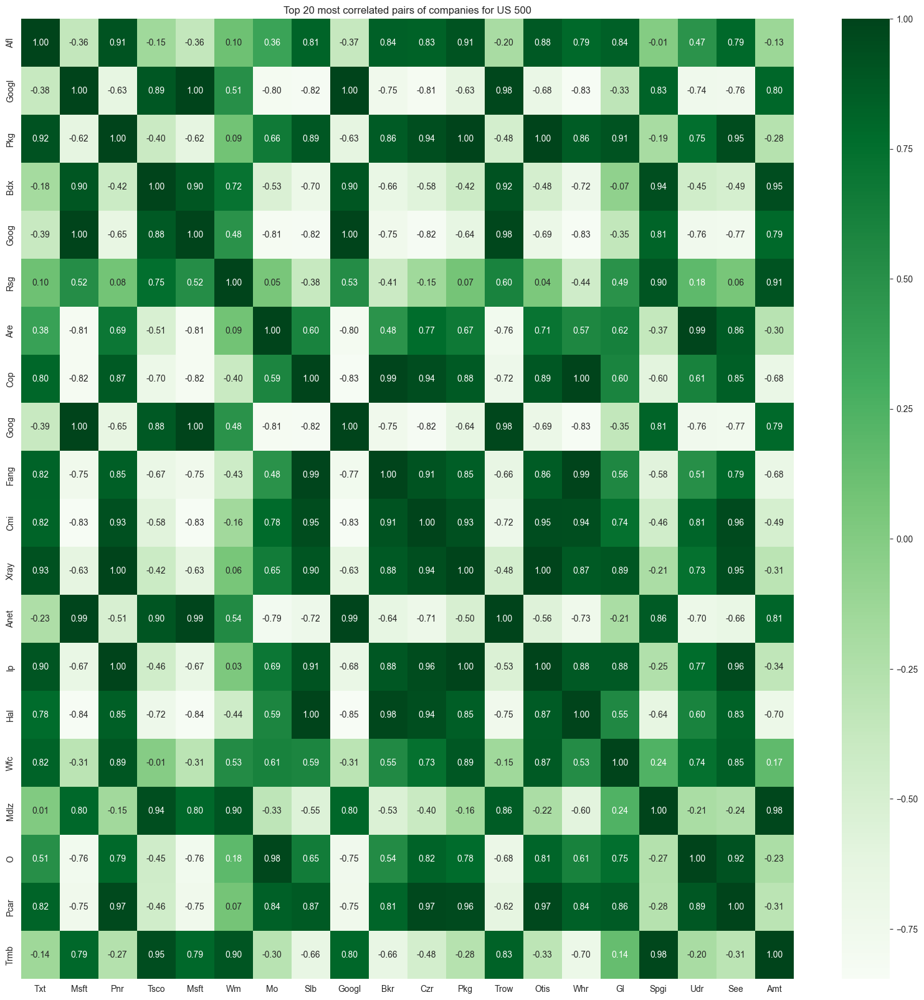

In [11]:
cmap = 'Greens'
sns.set_style("white")
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix.loc[corr_pairs.iloc[:,0], corr_pairs.iloc[:,1]], cmap=cmap, annot=True, fmt=".2f")
plt.title("Top 20 most correlated pairs of companies for US 500")
plt.show()

### ANALYSIS OF SIX MONTHS DATA SET OF TOP US 500 COMPANIES

In [12]:
us_price_data = yf.download(us_500, start="2022-09-21", end="2023-03-21")['Adj Close']
us_price_data.dropna(axis=1, inplace=True)

[*********************100%***********************]  505 of 505 completed

21 Failed downloads:
- VIAC: No timezone found, symbol may be delisted
- XLNX: No timezone found, symbol may be delisted
- WLTW: No timezone found, symbol may be delisted
- CTXS: No timezone found, symbol may be delisted
- BLL: No timezone found, symbol may be delisted
- ANTM: No timezone found, symbol may be delisted
- NLSN: No timezone found, symbol may be delisted
- NLOK: No timezone found, symbol may be delisted
- DRE: No timezone found, symbol may be delisted
- TWTR: No data found, symbol may be delisted
- CERN: No timezone found, symbol may be delisted
- FBHS: No timezone found, symbol may be delisted
- FB: No timezone found, symbol may be delisted
- DISCK: No timezone found, symbol may be delisted
- BF.B: No data found for this date range, symbol may be delisted
- KSU: No timezone found, symbol may be delisted
- DISCA: No timezone found, symbol may be delisted
- INFO: No timezone found, symbol may be delis

In [13]:
us_price_data[:5]

,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2022-09-21 00:00:00,126.073456,13.23,163.769562,153.231461,137.588730,138.267319,99.725792,263.168457,286.299988,147.097534,...,63.990002,71.432266,89.534721,30.527132,92.844818,111.542999,109.745903,285.079987,56.197941,150.565536
2022-09-22 00:00:00,123.990173,12.71,162.394089,152.254578,140.236374,139.151871,100.141937,260.094757,287.059998,144.025558,...,60.189999,71.382996,89.160629,29.307236,90.180176,109.779243,107.564941,272.940002,54.869274,148.793472
2022-09-23 00:00:00,123.083107,12.21,158.821838,149.951904,140.285400,136.359085,99.755516,257.774597,284.559998,140.636490,...,59.650002,70.506104,84.415642,29.733702,89.344994,109.640518,105.772346,268.040009,53.658703,149.380844
2022-09-26 00:00:00,121.916862,11.86,156.031311,150.290833,138.471298,135.514297,98.923225,255.355301,276.959991,139.546448,...,66.800003,68.919815,82.673180,29.446087,88.380554,108.164116,104.716721,265.859985,52.684341,147.937317
2022-09-27 00:00:00,121.219109,12.27,157.644272,151.277695,138.971390,134.609879,97.427094,254.165466,277.570007,140.527481,...,66.559998,67.363091,84.405792,29.108881,87.853592,106.786781,104.388077,264.950012,51.926502,148.733749


In [14]:
us_price_data.shape

(124, 483)

#### TOP 20 LESS VOLATILE COMPANIES IN SNP500 (LAST 6 MONTHS)

### Now we are building an algortihms for seprating top less volatile companies for investment.

This code is using technical analysis to identify less volatile companies in the SNP500 index. It calculates the relative strength index (RSI) for each company's stock prices using the ta.momentum.RSIIndicator function from the ta library. It then filters the companies where the RSI is below 30, which is considered oversold and potentially undervalued. Finally, it selects the top 20 less volatile companies based on the RSI and sorts them in ascending order using the sort_values method. The resulting companies are stored in the safe_companies variable.

In [15]:
#less volatile companies based on technical analysis
rsi_data = pd.DataFrame()
for col in us_price_data.columns:
    rsi = ta.momentum.RSIIndicator(us_price_data[col]).rsi()
    rsi_data[col] = rsi

#companies with RSI < 30
low_rsi = rsi_data.iloc[-1] < 30

In [16]:
#top 20 less volatile companies
safe_companies = low_rsi.sort_values().index[:20]

<Figure size 2000x600 with 0 Axes>

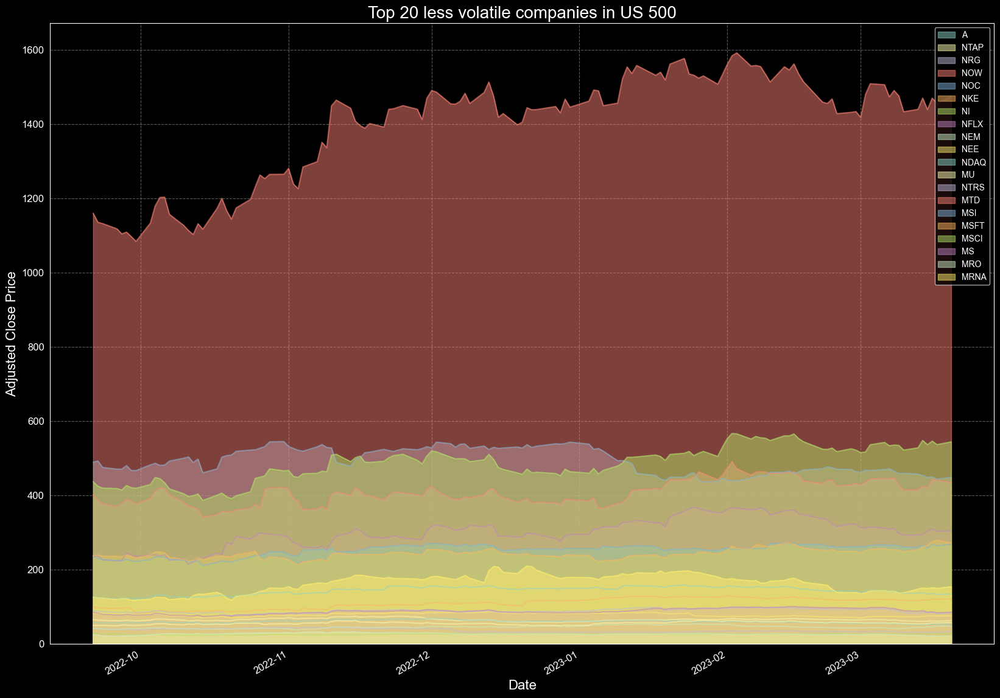

In [17]:
# Plot the prices of the top 20 safe companies as an area graph
plt.style.use('dark_background')
plt.figure(figsize=(20,6))
us_price_data[safe_companies].plot(kind='area', alpha=0.5, stacked=False, figsize=(20, 15))
plt.title("Top 20 less volatile companies in US 500", fontsize=20)
plt.xlabel("Date", fontsize=16)
plt.ylabel("Adjusted Close Price", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()
plt.close()

#### TOP 10 HIGH SHARE PRICE AND LOW SHARE PRICE IN SNP500 (lAST SIX MONTHS)

In [18]:
high_price_companies = us_price_data.max().sort_values(ascending=False).index[:10]
low_price_companies = us_price_data.max().sort_values().index[:10]

<Figure size 2000x600 with 0 Axes>

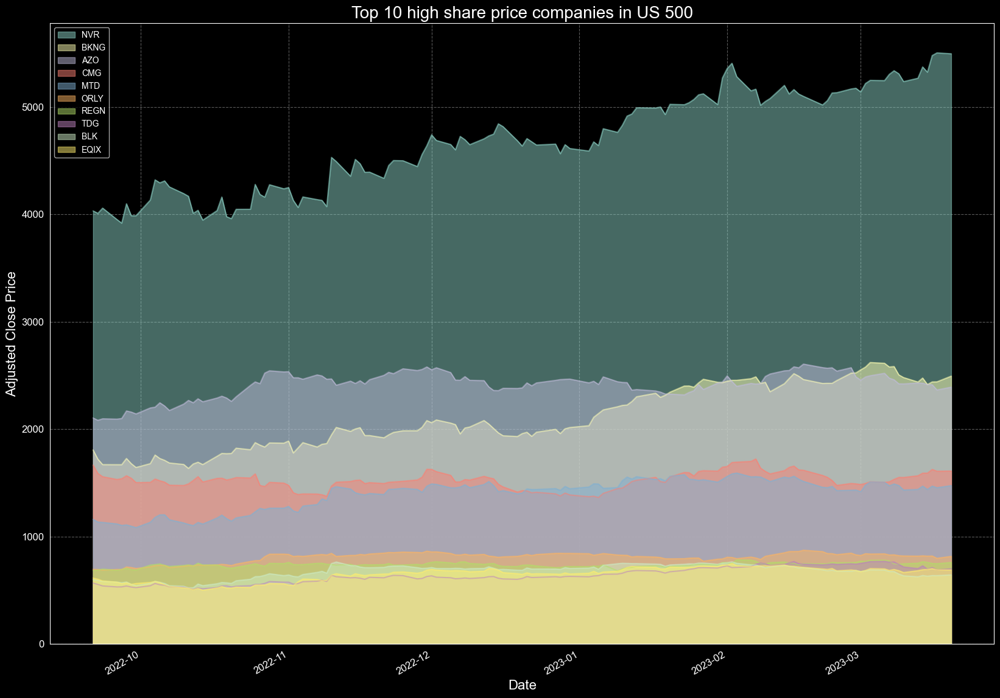

In [19]:
#top high share price companies as an area graph
plt.style.use('dark_background')
plt.figure(figsize=(20,6))
us_price_data[high_price_companies].plot(kind='area', alpha=0.5, stacked=False, figsize=(20, 15))
plt.title("Top 10 high share price companies in US 500", fontsize=20)
plt.xlabel("Date", fontsize=16)
plt.ylabel("Adjusted Close Price", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()
plt.close()

<Figure size 2000x600 with 0 Axes>

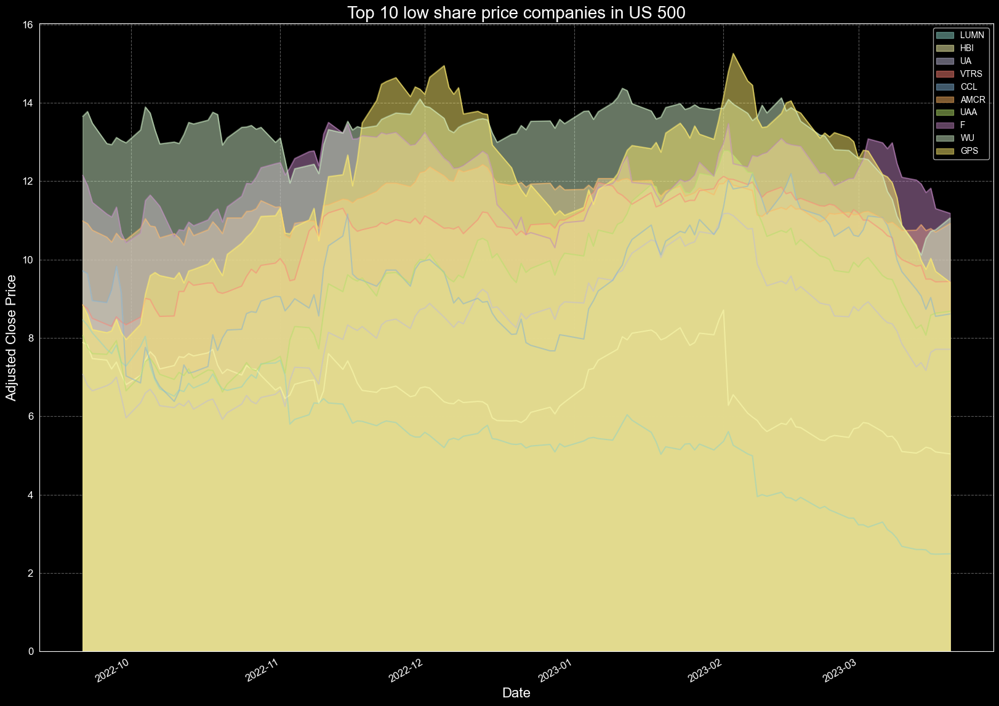

In [20]:
# Plot the prices of top low share price companies as an area graph
plt.style.use('dark_background')
plt.figure(figsize=(20,6))
us_price_data[low_price_companies].plot(kind='area', alpha=0.5, stacked=False, figsize=(20, 15))
plt.title("Top 10 low share price companies in US 500", fontsize=20)
plt.xlabel("Date", fontsize=16)
plt.ylabel("Adjusted Close Price", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()
plt.close()

### 3. U.K MARKET

The FTSE 100 is a stock market index that gauges the performance of the 100 largest publicly-traded companies in the United Kingdom. It is widely considered as a top indicator of the UK stock market's health and the overall UK economy.

The FTSE 100 also has a significant influence on the global economy since the UK is among the largest economies in the world and a key player in global trade and investment. The index's performance can impact not only the UK economy but also other nations and regions closely associated with the UK economy through trade, investment, and other forms of economic activity.

When the FTSE 100 performs well, it can foster investor confidence and lead to increased investment in the UK economy. This can, in turn, fuel economic growth and job creation. A robust UK economy can also increase demand for goods and services from other countries, thereby supporting worldwide economic growth.

On the flip side, when the FTSE 100 performs poorly, it can create negative ripple effects throughout the global economy. A downturn in the UK stock market can lower investor confidence and result in a reduction in investment and economic activity, both in the UK and in other nations closely tied to the UK economy.

In [21]:
ftse100_ticker = ["AAL.L", "ABF.L", "ADM.L", "ADN.L", "AGK.L", "AMEC.L", 
                  "ANTO.L", "ARM.L", "ASHM.L", "AV.L", "AZN.L", "BA.L", 
                  "BARC.L", "BATS.L", "BG.L", "BLND.L", "BLT.L", "BNZL.L", 
                  "BP.L", "BRBY.L", "BSY.L", "BT-A.L", "CCL.L", "CNA.L", 
                  "CPG.L", "CPI.L", "CRDA.L", "CRH.L", "CSCG.L", "DGE.L", 
                  "EMG.L", "ENRC.L", "EVR.L", "EXPN.L", "FRES.L", "GFS.L", 
                  "GKN.L", "GLEN.L", "GSK.L", "HL.L", "HMSO.L", "HSBA.L", 
                  "IAG.L", "IAP.L", "IHG.L", "IMI.L", "IMT.L", "IPR.L", 
                  "ITRK.L", "ITV.L", "JMAT.L", "KAZ.L", "KGF.L", "LAND.L", 
                  "LGEN.L", "LLOY.L", "MGGT.L", "MKS.L", "MRW.L", "NG.L", 
                  "NXT.L", "OML.L", "PFC.L", "POLY.L", "PRU.L", "PSON.L", 
                  "RB.L", "RBS.L", "RDSB.L", "REL.L", "REX.L", "RIO.L", 
                  "RR.L", "RRS.L", "RSA.L", "RSL.L", "SAB.L", "SBRY.L", 
                  "SDR.L", "SDRC.L", "SGE.L", "SHP.L", "SL.L", "SMIN.L", 
                  "SN.L", "SRP.L", "SSE.L", "STAN.L", "SVT.L", "TATE.L", 
                  "TLW.L", "TSCO.L", "ULVR.L", "UU.L", "VED.L", "VOD.L", 
                  "WEIR.L", "WOS.L", "WPP.L", "WTB.L", "XTA.L"]

In [22]:
uk_price_data = yf.download(ftse100_ticker, start="2023-03-13", end="2023-03-20")['Adj Close']
uk_price_data.dropna(axis=1, inplace=True)

[*********************100%***********************]  101 of 101 completed

32 Failed downloads:
- XTA.L: No data found for this date range, symbol may be delisted
- RSL.L: No data found for this date range, symbol may be delisted
- RBS.L: No timezone found, symbol may be delisted
- AGK.L: No timezone found, symbol may be delisted
- OML.L: No data found for this date range, symbol may be delisted
- CSCG.L: No data found for this date range, symbol may be delisted
- IPR.L: No data found for this date range, symbol may be delisted
- BSY.L: No data found for this date range, symbol may be delisted
- MRW.L: No timezone found, symbol may be delisted
- RRS.L: No data found for this date range, symbol may be delisted
- SDRC.L: No timezone found, symbol may be delisted
- ENRC.L: No data found for this date range, symbol may be delisted
- BG.L: No data found for this date range, symbol may be delisted
- BLT.L: No data found for this date range, symbol may be delisted
- KAZ.L: No timezone found, s

In [23]:
df_weekly = pd.DataFrame(data=uk_price_data)
df_weekly.columns = df_weekly.columns.str.title()
df_weekly.tail(5)

,Aal.L,Abf.L,Adm.L,Anto.L,Ashm.L,Av.L,Azn.L,Ba.L,Barc.L,Bats.L,...,Svt.L,Tate.L,Tlw.L,Tsco.L,Ulvr.L,Uu.L,Vod.L,Weir.L,Wpp.L,Wtb.L
Date,,,,,,,,,,,,,,,,,,,,,
2023-03-13 00:00:00,2649.128418,1948.0,1912.0,1500.5,235.800003,424.299988,10686.0,908.000000,147.479996,2955.306885,...,2824.0,772.599976,32.000000,255.000000,4056.0,1044.5,95.680000,1802.5,950.200012,2852.0
2023-03-14 00:00:00,2689.914062,1989.5,1920.0,1539.0,243.800003,428.600006,10686.0,938.000000,152.059998,2942.067383,...,2812.0,775.000000,32.360001,254.800003,4073.0,1043.5,96.180000,1860.0,966.799988,2916.0
2023-03-15 00:00:00,2485.500000,1900.0,1896.5,1445.5,233.800003,407.000000,10644.0,911.599976,138.240005,2902.839844,...,2810.0,766.200012,29.379999,251.899994,4040.5,1053.5,94.019997,1729.0,921.400024,2811.0
2023-03-16 00:00:00,2479.000000,1949.5,1954.5,1454.0,239.399994,415.000000,10798.0,916.799988,142.380005,2911.175781,...,2850.0,776.799988,29.000000,252.000000,4087.0,1065.0,92.669998,1742.0,939.599976,2871.0
2023-03-17 00:00:00,2504.000000,1901.5,1914.5,1444.0,231.199997,402.200012,10814.0,905.599976,139.559998,2891.562012,...,2813.0,771.400024,28.940001,246.899994,4047.5,1044.0,90.370003,1712.5,916.000000,2804.0


In [24]:
# Compute the correlation matrix
corr_matrix = uk_price_data.corr()

# Find the top 20 most correlated pairs of companies
corr_pairs = corr_matrix.unstack().sort_values(ascending=False)
corr_pairs = corr_pairs[corr_pairs != 1].drop_duplicates()[:20]
corr_pairs = pd.DataFrame(corr_pairs).reset_index()

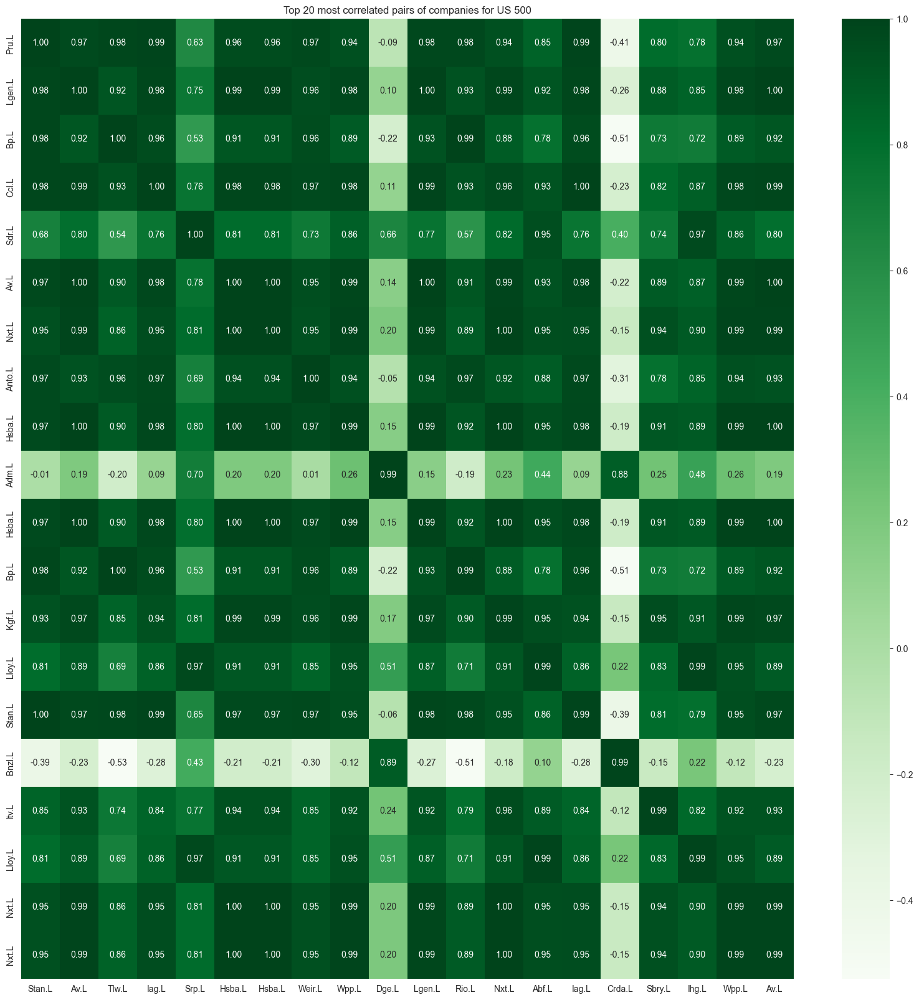

In [25]:
cmap = 'Greens'
sns.set_style("white")
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix.loc[corr_pairs.iloc[:,0], corr_pairs.iloc[:,1]], cmap=cmap, annot=True, fmt=".2f")
plt.title("Top 20 most correlated pairs of companies for US 500")
plt.show()

### ANALYSIS OF SIX MONTHS DATA SET OF TOP UK 100 COMPANIES

In [26]:
uk_price_data = yf.download(ftse100_ticker, start="2022-09-21", end="2023-03-21")['Adj Close']
uk_price_data.dropna(axis=1, inplace=True)

[*********************100%***********************]  101 of 101 completed

32 Failed downloads:
- IPR.L: No data found for this date range, symbol may be delisted
- XTA.L: No data found for this date range, symbol may be delisted
- RBS.L: No timezone found, symbol may be delisted
- RSL.L: No data found for this date range, symbol may be delisted
- AGK.L: No timezone found, symbol may be delisted
- CSCG.L: No data found for this date range, symbol may be delisted
- OML.L: No data found for this date range, symbol may be delisted
- BSY.L: No data found for this date range, symbol may be delisted
- MRW.L: No timezone found, symbol may be delisted
- RRS.L: No data found for this date range, symbol may be delisted
- SDRC.L: No timezone found, symbol may be delisted
- BG.L: No data found for this date range, symbol may be delisted
- ENRC.L: No data found for this date range, symbol may be delisted
- BLT.L: No data found for this date range, symbol may be delisted
- KAZ.L: No timezone found, s

#### TOP 20 LESS VOLATILE COMPANIES IN FTSE100 (LAST 6 MONTHS)

In [27]:
#less volatile companies based on technical analysis
rsi_data = pd.DataFrame()
for col in uk_price_data.columns:
    rsi = ta.momentum.RSIIndicator(uk_price_data[col]).rsi()
    rsi_data[col] = rsi

#companies with RSI < 30
low_rsi = rsi_data.iloc[-1] < 30

In [28]:
#top 20 less volatile companies
safe_companies = low_rsi.sort_values().index[:20]

<Figure size 2000x600 with 0 Axes>

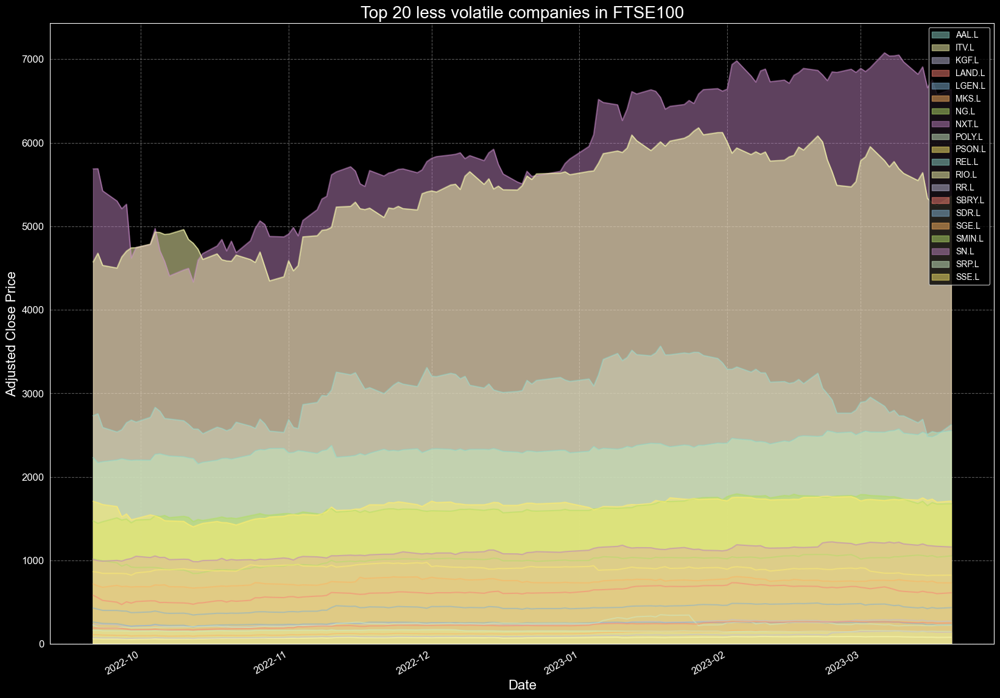

In [29]:
# Plot the prices of the top 20 safe companies as an area graph
plt.style.use('dark_background')
plt.figure(figsize=(20,6))
uk_price_data[safe_companies].plot(kind='area', alpha=0.5, stacked=False, figsize=(20, 15))
plt.title("Top 20 less volatile companies in FTSE100", fontsize=20)
plt.xlabel("Date", fontsize=16)
plt.ylabel("Adjusted Close Price", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()
plt.close()

#### TOP 10 HIGH SHARE PRICE AND LOW SHARE PRICE IN FTSE100 (lAST SIX MONTHS)

In [30]:
high_price_companies = uk_price_data.max().sort_values(ascending=False).index[:10]
low_price_companies = uk_price_data.max().sort_values().index[:10]

<Figure size 2000x600 with 0 Axes>

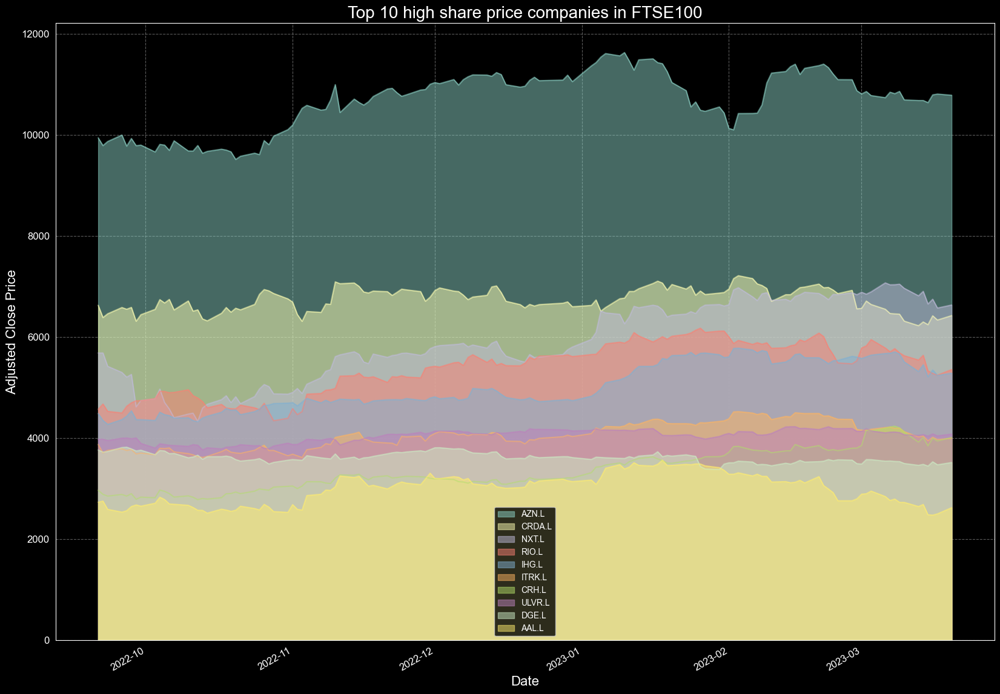

In [31]:
#top high share price companies as an area graph
plt.style.use('dark_background')
plt.figure(figsize=(20,6))
uk_price_data[high_price_companies].plot(kind='area', alpha=0.5, stacked=False, figsize=(20, 15))
plt.title("Top 10 high share price companies in FTSE100", fontsize=20)
plt.xlabel("Date", fontsize=16)
plt.ylabel("Adjusted Close Price", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()
plt.close()

<Figure size 2000x600 with 0 Axes>

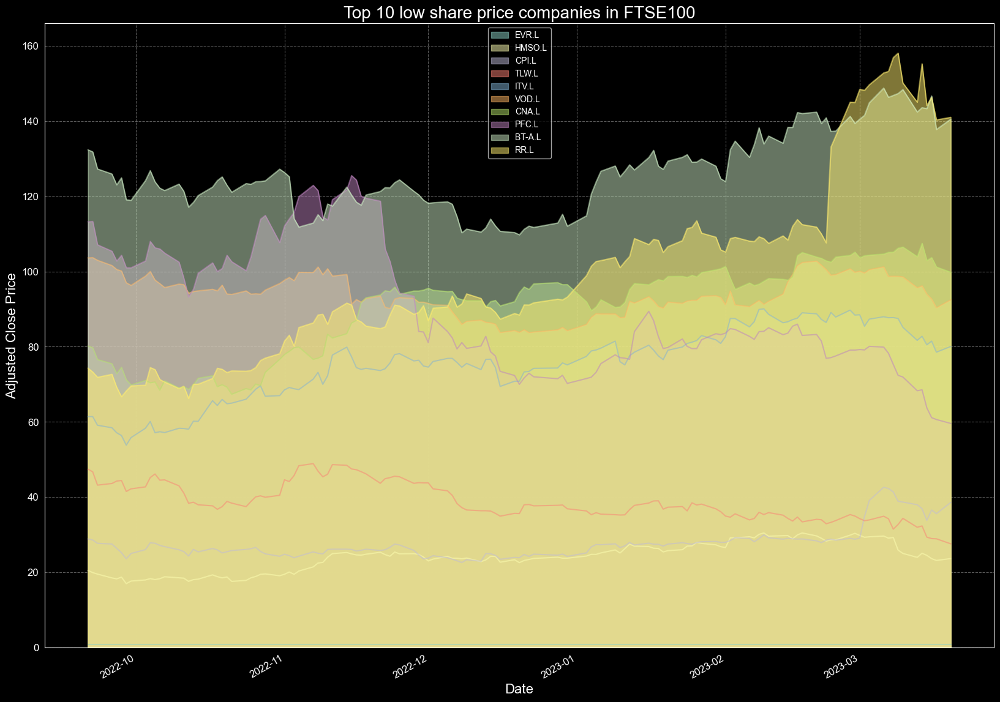

In [32]:
# Plot the prices of top low share price companies as an area graph
plt.style.use('dark_background')
plt.figure(figsize=(20,6))
uk_price_data[low_price_companies].plot(kind='area', alpha=0.5, stacked=False, figsize=(20, 15))
plt.title("Top 10 low share price companies in FTSE100", fontsize=20)
plt.xlabel("Date", fontsize=16)
plt.ylabel("Adjusted Close Price", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()
plt.close()

### 4. BONDS

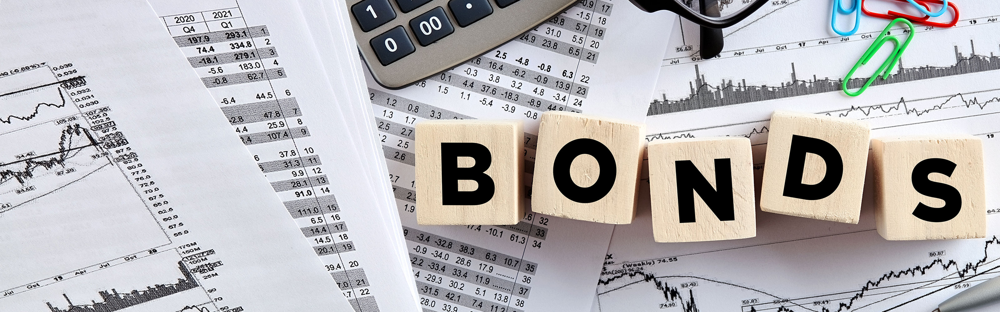

  **Bonds are debt securities that are issued by governments, corporations, and other entities to raise capital. They are essentially loans that investors make to the issuer in exchange for periodic interest payments and the return of the face value of the bond when it matures.**

1. Government bonds: Bonds issued by national, state, or local governments.

2. Corporate bonds: Bonds issued by corporations to raise capital for various purposes, such as funding expansion plans or repaying existing debt.

3. Municipal bonds: Bonds issued by cities, counties, or other local government entities to finance public projects or services.

4. Treasury bonds: Bonds issued by the federal government to finance the national debt and support the economy.

5. Agency bonds: Bonds issued by government-sponsored entities, such as Freddie Mac and Fannie Mae.

6. High-yield bonds: Also known as junk bonds, these are bonds issued by companies with lower credit ratings and therefore higher risk of default. They offer higher yields to compensate for this risk.

7. Floating-rate bonds: Bonds with a variable interest rate that changes periodically based on a benchmark rate, such as the London Interbank Offered Rate (LIBOR).

8. Convertible bonds: Bonds that can be converted into a specified number of shares of the issuer's common stock.

9. Zero-coupon bonds: Bonds that are sold at a discount to face value and pay no periodic interest, but instead pay the full face value when they mature.

10. Asset-backed bonds: Bonds backed by a specific asset, such as a mortgage or consumer loan.

11. Floating rate notes (FRNs): Similar to floating-rate bonds, but usually issued by financial institutions.

12. Exchange-traded bonds (ETBs): Bonds that are traded on an exchange, like stocks.

13. Foreign bonds: Bonds issued by a foreign entity, such as a foreign government or corporation.

14. Perpetual bonds: Bonds with no maturity date, meaning they pay interest indefinitely.

15. Callable bonds: Bonds that can be redeemed by the issuer before the maturity date.

16. Puttable bonds: Bonds that can be sold back to the issuer before the maturity date.

bonds can be seen as a hedge against inflation, as the interest paid on bonds usually increases with inflation. This means that as the cost of goods and services increases, the return on bonds increases as well, helping to offset some of the negative effects of inflation.

However, during periods of high inflation, the value of bonds can decline due to the increased cost of borrowing and declining purchasing power of the currency. This can result in losses for bondholders.

During a recession, the demand for bonds usually increases as investors seek safe, low-risk investments. This can lead to lower interest rates and an increase in bond prices. However, if the recession is severe and long-lasting, it can lead to a decline in the creditworthiness of many companies, resulting in declining bond prices and increased risk of default.

### **5. TECHNICAL ANALYSIS**

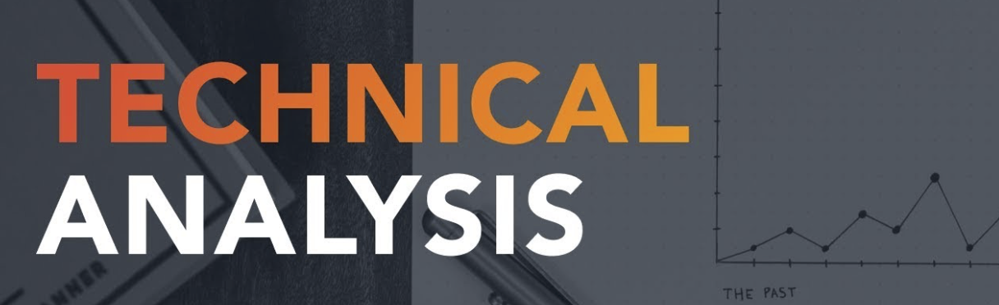

1. Long-term investments: A long-term investment is typically an investment with a holding period of more than one year. When considering a long-term investment in a company, it is important to conduct a fundamental analysis of the company at least once a year. This will provide an updated view of the company's financial performance, stability, and growth prospects. Based on this information, you can adjust your investment strategy accordingly to ensure your investment aligns with your long-term goals.

2. Short-term investments: A short-term investment is typically an investment with a holding period of less than one year. When considering a short-term investment in a company, it is important to conduct a fundamental analysis more frequently, such as every quarter or every six months. This will provide an updated view of the company's financial performance and stability, which can change quickly in the short term. Based on this information, you can adjust your investment strategy accordingly to ensure your investment aligns with your short-term goals.

3. High-risk investments: High-risk investments are investments that carry a higher level of risk, such as stocks in small, unproven companies or stocks in industries that are facing challenges. When considering a high-risk investment, it is important to conduct a fundamental analysis more frequently to stay informed about the financial performance and stability of the company. This will help you make informed decisions about the investment and minimize the risks associated with the investment.

4. Low-risk investments: Low-risk investments are investments that carry a lower level of risk, such as bonds or blue-chip stocks. When considering a low-risk investment, it may not be necessary to conduct a fundamental analysis as frequently as you would for a high-risk investment. However, it is still important to review the investment regularly and conduct a fundamental analysis as needed to ensure your investment aligns with your goals.

#### 1. Total Period of Trading (Maximum Chart)

In [33]:
ticker = "CS"
stock = yf.download(ticker)
stock.shape

[*********************100%***********************]  1 of 1 completed


(7013, 6)

In [34]:
stock.tail()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-03-17,2.0500,2.1000,1.940,2.0100,2.0100,136229600
2023-03-20,0.9100,1.0800,0.900,0.9400,0.9400,375645900
2023-03-21,0.9700,1.0000,0.940,0.9700,0.9700,210272500
2023-03-22,0.9400,0.9600,0.910,0.9200,0.9200,100043800
2023-03-23,0.9066,0.9078,0.895,0.8977,0.8977,23245023


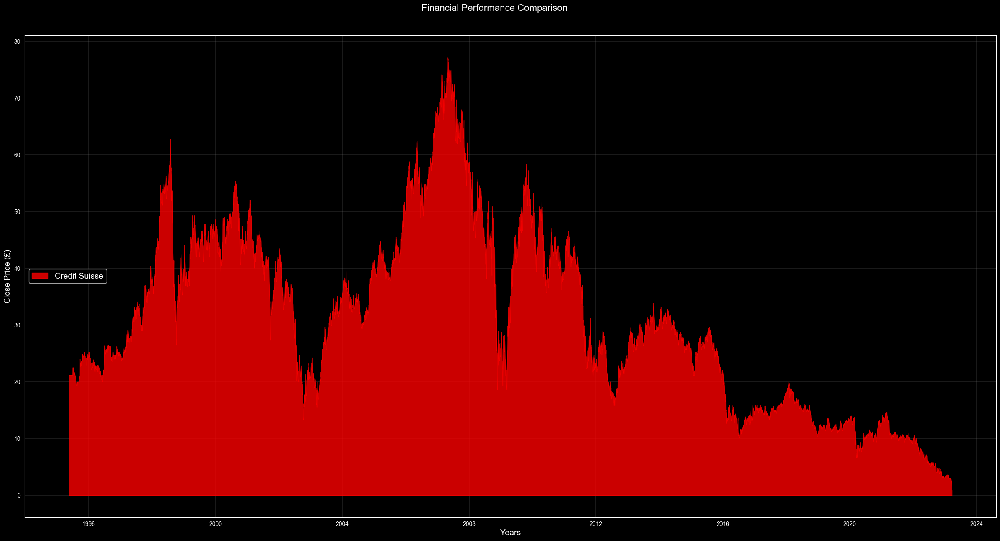

In [35]:
plt.style.use('dark_background')
plt.figure(figsize=(30,15))
plt.grid(True, color='grey', linewidth=0.3)
plt.fill_between(stock.index, 0, stock['Close'], color="red", label='Credit Suisse', alpha=0.8)
plt.xlabel('Years', fontsize=14)
plt.ylabel('Close Price (£)', fontsize=14)
plt.legend(loc='center left', fontsize=14)
plt.suptitle("Financial Performance Comparison", fontsize=16, y=0.93)
plt.show()

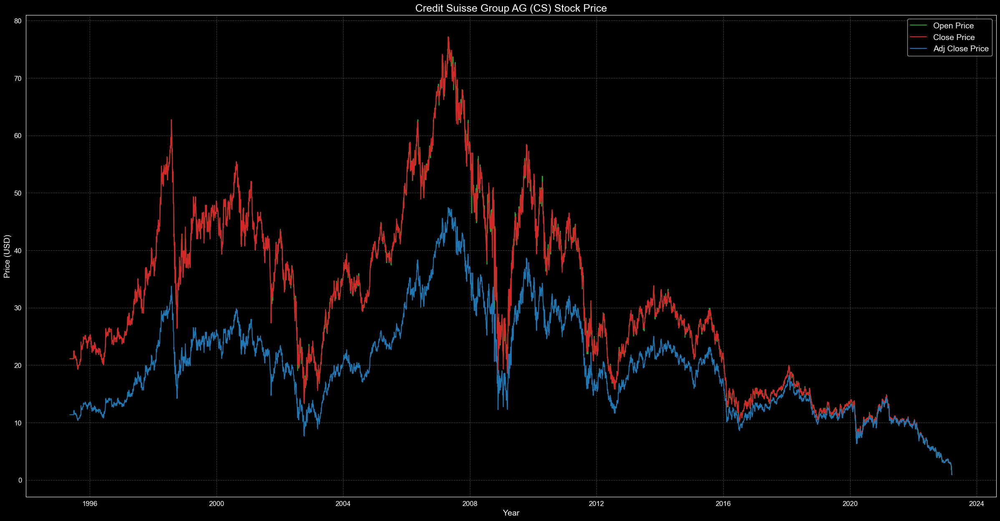

In [36]:
plt.style.use('dark_background')
plt.figure(figsize=(30,15))
plt.plot(stock['Open'], color='tab:green', label='Open Price')
plt.plot(stock['Close'], color='tab:red', label='Close Price')
plt.plot(stock['Adj Close'], color='tab:blue', label='Adj Close Price')
plt.title("Credit Suisse Group AG (CS) Stock Price", fontsize=18)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Price (USD)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.grid(linestyle='--', color='gray', alpha=0.5)
plt.show()

### 1. ThresholdClassifier Algortihms Design by Hemant Thapa 

This classifier will work with respect to time series analysis, it can be varies from 1months, 6months, 1years, 5years, 10years, and Total trading years. The algorithm takes in a list of numerical data, calculates the mean value of the data, and sets the threshold value to be equal to the mean. The algorithm then iterates through each value in the data list and compares it to the threshold value. If the value is greater than the threshold value, the algorithm classifies it as a 1 (positive class), otherwise, it classifies it as a 0 (negative class). 

It will help to you identifies the positive and negative trade over your trading period. 

In [48]:
class ThresholdClassifier:
    def __init__(self, threshold: float):
        self.threshold = threshold
        
    def classify(self, data: List[float]):
        self.mean = sum(data) / len(data)
        self.threshold = self.mean
        classifications = []
        for value in data:
            if value > self.threshold:
                classifications.append(1)
            else:
                classifications.append(0)
        return classifications
    

In [49]:
classifier = ThresholdClassifier(0.5)

In [50]:
class ThresholdPlot:
    def __init__(self, data, classification):
        self.data = data
        self.classification = classification
        
    def plot(self):
        plt.style.use('dark_background')
        plt.figure(figsize=(30,7))
        plt.xlabel("Time", fontsize=14)
        plt.ylabel("Price (£)", color="tab:red", fontsize=14)
        plt.plot(self.data.index, self.data, color="tab:red")
        plt.twinx()
        plt.ylabel("Classification", color="tab:blue", fontsize=14)
        plt.plot(self.data.index, self.classification, color="tab:blue")
        plt.axhline(y=0.5, color="gray", linestyle="--", alpha=0.8)
        plt.title("Binary Classifications", fontsize=20, color="White")
        plt.grid(linestyle='--', color='gray', alpha=0.2)
        plt.show()

        colors = []
        for value in self.classification:
            if value > 0.5:
                colors.append("tab:green")
            else:
                colors.append("tab:red")

        plt.style.use('dark_background')
        plt.figure(figsize=(30,7))
        plt.xlabel("Time", fontsize=14)
        plt.ylabel("Price (£)", color="tab:red", fontsize=14)
        plt.plot(self.data.index, self.data, color="tab:red")
        plt.tick_params(axis="both", labelsize=12)
        plt.twinx()
        plt.ylabel("Classification", color="tab:blue", fontsize=14)
        plt.scatter(self.data.index, self.classification, color=colors)
        plt.tick_params(axis="both", labelsize=12)
        plt.title("Binary Classifications", fontsize=18, color="White")
        plt.grid(linestyle='--', color='gray', alpha=0.2)
        plt.show()


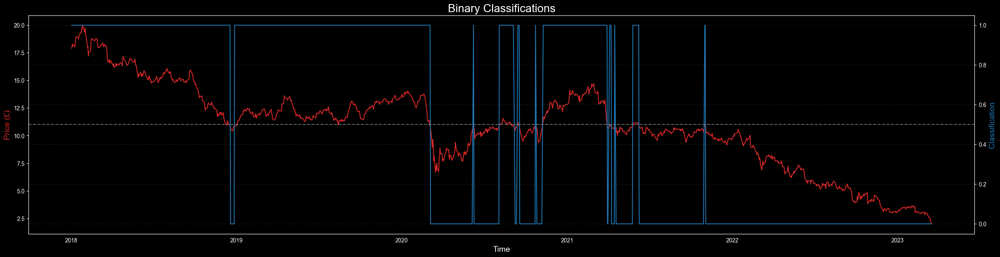

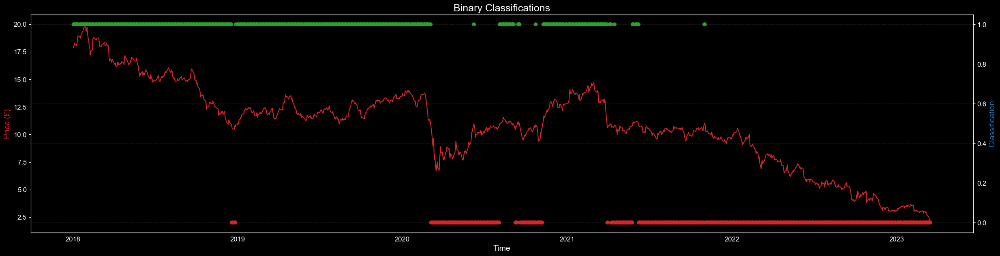

In [51]:
classifier = ThresholdClassifier(0.5)
classification = classifier.classify(stock['Close'].tolist())
plot = ThresholdPlot(stock['Close'], classification)
plot.plot()

 **10 YEAR CHART**

In [52]:
ticker = "CS"
stock = yf.download(ticker, start="2013-01-01", end="2023-03-20")
stock.shape

[*********************100%***********************]  1 of 1 completed


(2570, 6)

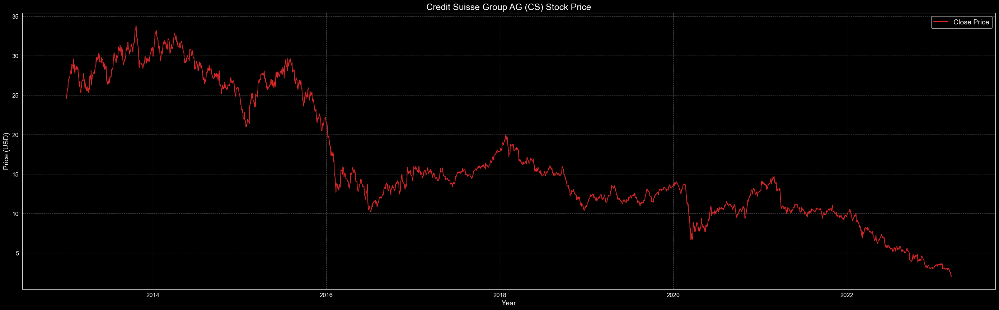

In [53]:
plt.style.use('dark_background')
plt.figure(figsize=(35,10))
plt.plot(stock['Close'], color='tab:red', label='Close Price')
plt.title("Credit Suisse Group AG (CS) Stock Price", fontsize=18)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Price (USD)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

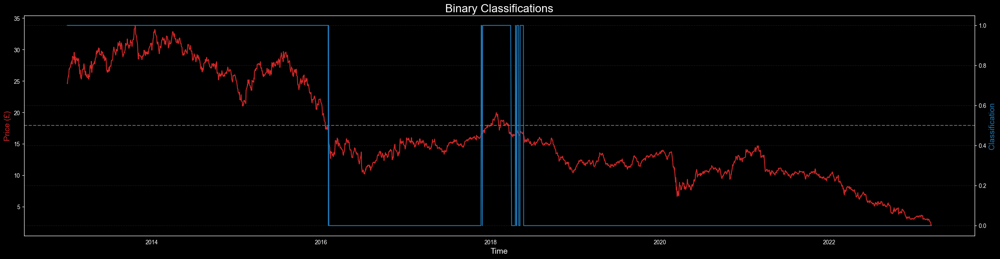

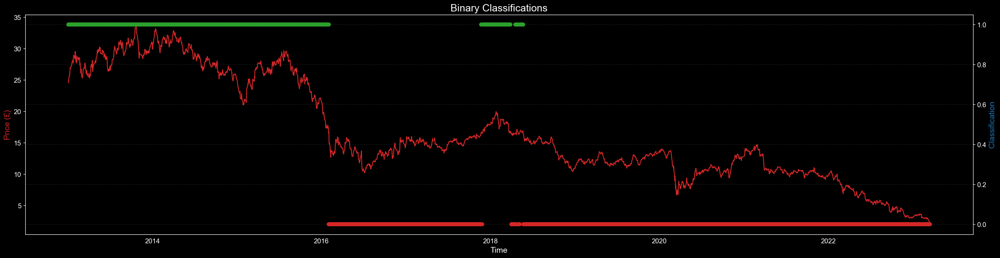

In [54]:
classifier = ThresholdClassifier(0.5)
classification = classifier.classify(stock['Close'].tolist())
plot = ThresholdPlot(stock['Close'], classification)
plot.plot()

**5 YEAR CHART**

In [55]:

ticker = "CS"
stock = yf.download(ticker, start="2018-01-01", end="2023-03-20")
stock.shape

[*********************100%***********************]  1 of 1 completed


(1311, 6)

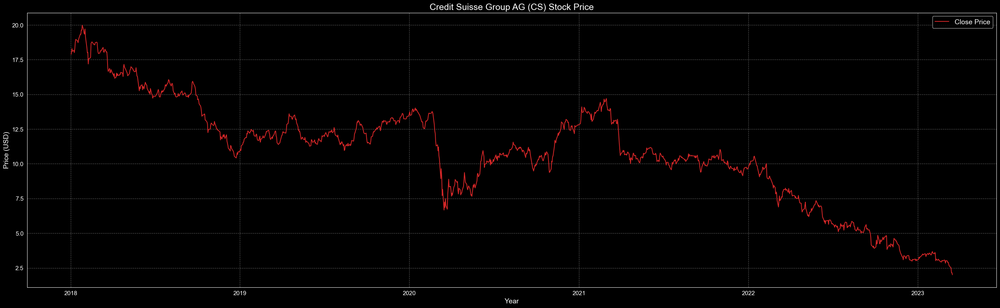

In [56]:
plt.style.use('dark_background')
plt.figure(figsize=(35,10))
plt.plot(stock['Close'], color='tab:red', label='Close Price')
plt.title("Credit Suisse Group AG (CS) Stock Price", fontsize=18)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Price (USD)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

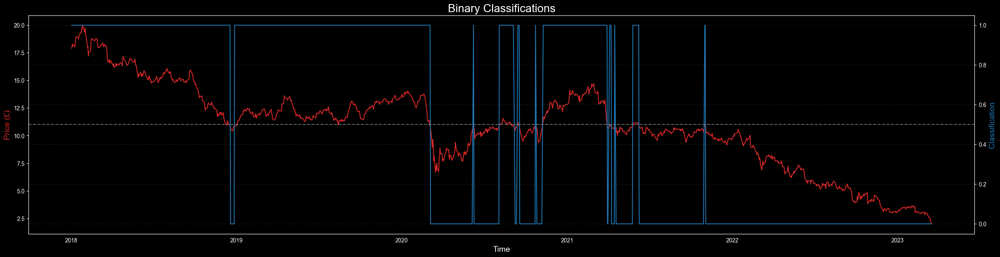

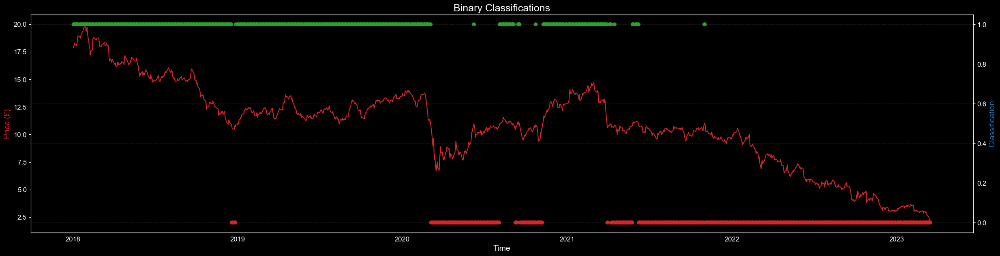

In [57]:
classifier = ThresholdClassifier(0.5)
classification = classifier.classify(stock['Close'].tolist())
plot = ThresholdPlot(stock['Close'], classification)
plot.plot()

**1 YEAR CHART**

In [58]:
ticker = "CS"
stock = yf.download(ticker, start="2022-01-01", end="2023-03-20")
stock.shape

[*********************100%***********************]  1 of 1 completed


(303, 6)

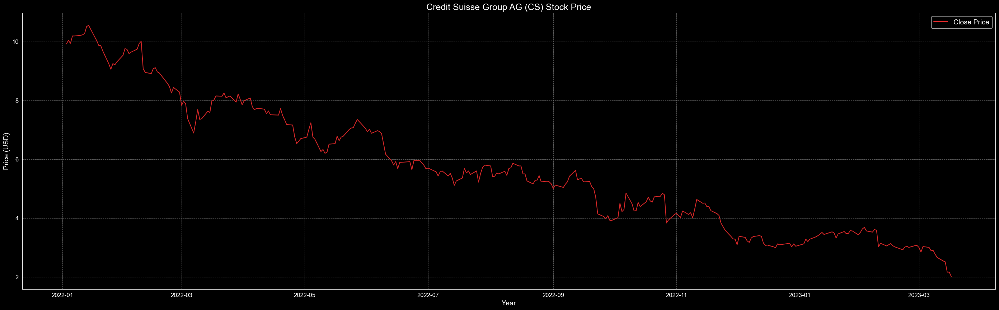

In [59]:
plt.style.use('dark_background')
plt.figure(figsize=(35,10))
plt.plot(stock['Close'], color='tab:red', label='Close Price')
plt.title("Credit Suisse Group AG (CS) Stock Price", fontsize=18)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Price (USD)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

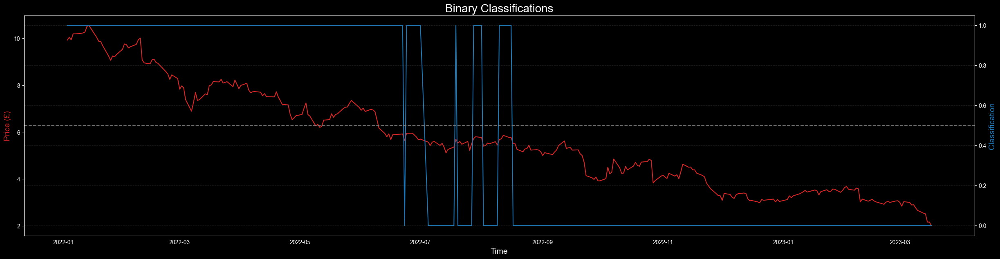

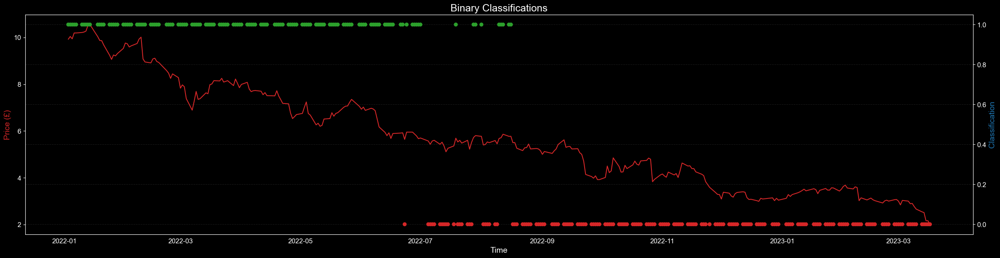

In [60]:
classifier = ThresholdClassifier(0.5)
classification = classifier.classify(stock['Close'].tolist())
plot = ThresholdPlot(stock['Close'], classification)
plot.plot()

#### 6 MONTHS CHART

In [61]:
ticker = "CS"
stock = yf.download(ticker, start="2022-09-20", end="2023-03-20")
stock.shape

[*********************100%***********************]  1 of 1 completed


(124, 6)

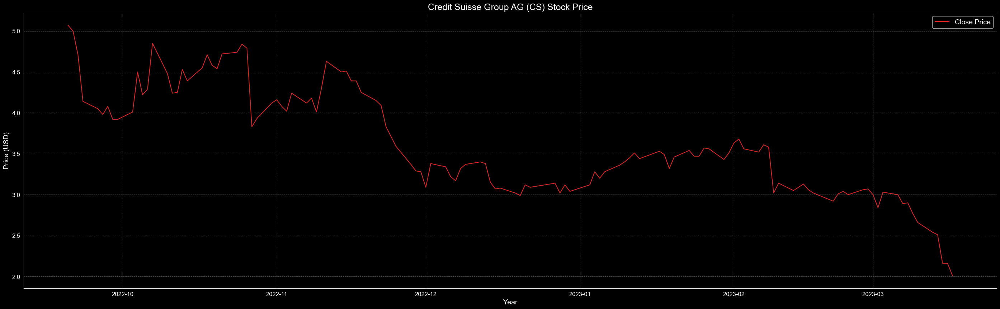

In [62]:
plt.style.use('dark_background')
plt.figure(figsize=(35,10))
plt.plot(stock['Close'], color='tab:red', label='Close Price')
plt.title("Credit Suisse Group AG (CS) Stock Price", fontsize=18)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Price (USD)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=14)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

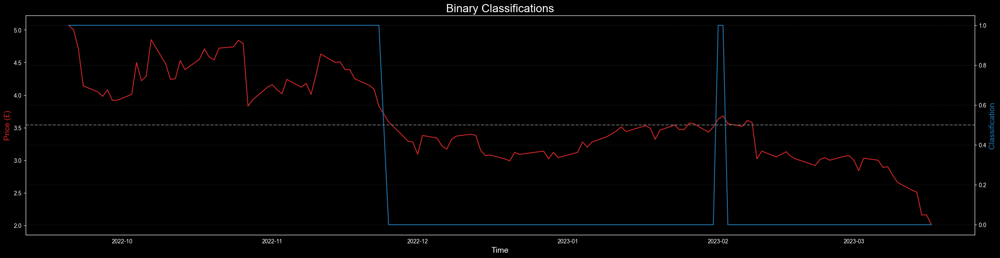

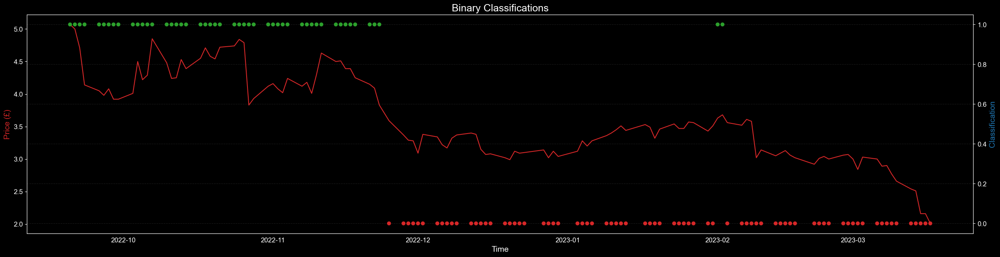

In [63]:
classifier = ThresholdClassifier(0.5)
classification = classifier.classify(stock['Close'].tolist())
plot = ThresholdPlot(stock['Close'], classification)
plot.plot()

## 2. LINEAR REGRESSION MODEL 

Credit Suisse is one of the largest financial institutions in the world, and as such, its performance can have ripple effects on the global economy. Credit Suisse provides a range of financial services, including investment banking, wealth management, and asset management, and its operations span across multiple countries and regions.

The performance of Credit Suisse can affect the global economy in several ways. For example, if Credit Suisse performs well, it can attract investment and stimulate economic growth in the countries and regions where it operates. Conversely, if Credit Suisse experiences financial difficulties, it can lead to a reduction in investment and economic activity, which can have negative effects on the global economy.

Moreover, the collapse or failure of a major financial institution like Credit Suisse can have systemic effects on the global economy, particularly if it triggers a broader financial crisis. The failure of Lehman Brothers in 2008, for example, had far-reaching impacts on the global economy and was a major contributor to the global financial crisis that followed.

Credit Suisse's impact on the S&P 500 may be limited as Credit Suisse is a Swiss financial institution and is not included in the S&P 500 index. However, as a major global financial institution, the performance of Credit Suisse can still have indirect effects on the US economy and, by extension, the S&P 500.

Credit Suisse experiences financial difficulties, it may reduce its investment in the US and may even reduce its lending to US companies and individuals, which can affect the US economy and the performance of the S&P 500. Additionally, if Credit Suisse's financial difficulties are severe enough, it could contribute to broader economic trends and developments that could indirectly affect the S&P 500.

#### MAX CHART - CREDIT SUISSE AND SNP500

In [64]:
credit_suisse = yf.Ticker("CS").history(period="max")
snp500 = yf.Ticker("^GSPC").history(period="max")
ftse100 = yf.Ticker("^FTSE").history(period="max")

In [65]:
from forex_python.converter import CurrencyRates

In [66]:
c = CurrencyRates()
exchange_rate = c.get_rate('GBP', 'USD')
ftse100["Close"] = ftse100["Close"] * exchange_rate
ftse100["Open"] = ftse100["Open"] * exchange_rate
ftse100["High"] = ftse100["High"] * exchange_rate
ftse100["Low"] = ftse100["Low"] * exchange_rate

In [67]:
ftse100.tail(2)

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2023-03-22 00:00:00+00:00,9244.005585,9304.600177,9206.348308,9281.539482,892439300,0.0,0.0
2023-03-23 00:00:00+00:00,9281.588594,9281.588594,9170.322523,9205.612220,0,0.0,0.0


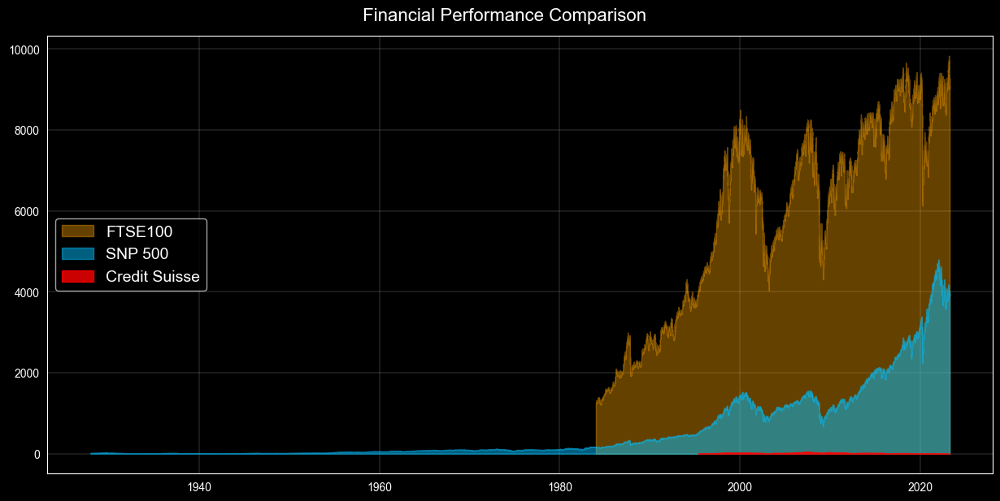

In [68]:
plt.style.use('dark_background')
plt.figure(figsize=(15,7))
plt.grid(True, color='grey', linewidth=0.3)
plt.plot(snp500.index, snp500['Close'], alpha=0.2, color="#00bfff", linewidth=0.7)
plt.fill_between(ftse100.index, 0, ftse100['Close'], color="orange", label='FTSE100', alpha=0.4)
plt.fill_between(snp500.index, 0, snp500['Close'], color="#00bfff", label='SNP 500', alpha=0.5)
plt.fill_between(credit_suisse.index, 0, credit_suisse['Close'], color="red", label='Credit Suisse', alpha=0.8)
plt.legend(loc='center left', fontsize=14)
plt.suptitle("Financial Performance Comparison", fontsize=16, y=0.93)
plt.show()

SNP500 is the oldest index in Global finance, The S&P 500 is not a stock itself, but rather a stock market index that measures the performance of the 500 largest publicly traded companies in the United States. The index was first introduced in 1923 by Standard & Poor's Financial Services and has undergone several revisions since then. first S&P 500 index fund was introduced by Vanguard in 1976.

The FTSE 100 Index was launched on January 3, 1984, by the Financial Times Stock Exchange. well, Credit Suisse Group AG, a Swiss multinational investment bank, was first established in 1856, but it did not go public until 1997. It was listed on the Zurich and New York stock exchanges on October 31, 1997.

### 5 YEAR CHART

A 5-year chart can also provide a more accurate representation of a company's financial performance over time. Short-term fluctuations and market noise may be smoothed out, giving a clearer picture of the company's growth and stability.

#### Credit Suisse 

In [69]:
ticker = "CS"
stock = yf.download(ticker, start="2018-03-20", end="2023-03-20")
stock.shape

[*********************100%***********************]  1 of 1 completed


(1258, 6)

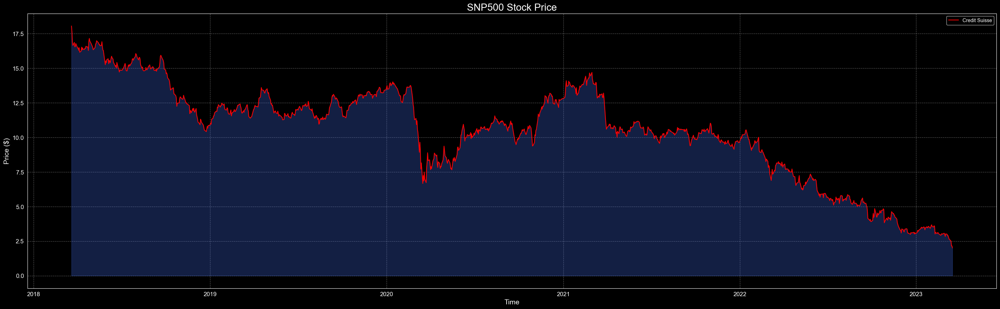

In [70]:
plt.style.use('dark_background')
plt.figure(figsize=(35,10))
plt.plot(stock.index, stock['Close'], label='Credit Suisse', color="red")
plt.fill_between(stock.index, stock['Close'], 0, alpha=0.3, color='royalblue')
plt.title('SNP500 Stock Price', fontsize=20, color="White")
plt.xlabel("Time", fontsize=14)
plt.ylabel("Price ($)", fontsize=14)
plt.legend(loc='best')
plt.tick_params(axis="both", labelsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

#### SNP500

In [71]:
ticker2 = "^GSPC"
stock2 = yf.download(ticker2, start="2018-03-20", end="2023-03-20")
stock2.shape

[*********************100%***********************]  1 of 1 completed


(1258, 6)

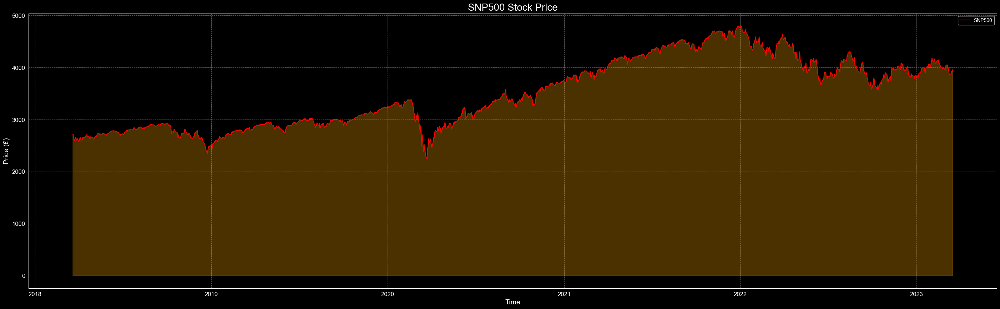

In [72]:
plt.style.use('dark_background')
plt.figure(figsize=(35,10))
plt.plot(stock2.index, stock2['Close'], label='SNP500', color="red")
plt.fill_between(stock2.index, stock2['Close'], 0, alpha=0.3,color='orange')
plt.title('SNP500 Stock Price', fontsize=20, color="White")
plt.xlabel("Time", fontsize=14)
plt.ylabel("Price (£)", fontsize=14)
plt.legend(loc='best')
plt.tick_params(axis="both", labelsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

### FTSE100

In [73]:
ticker3 = "^FTSE"
stock3 = yf.download(ticker3, start="2018-03-20", end="2023-03-20")
stock3.shape

[*********************100%***********************]  1 of 1 completed


(1261, 6)

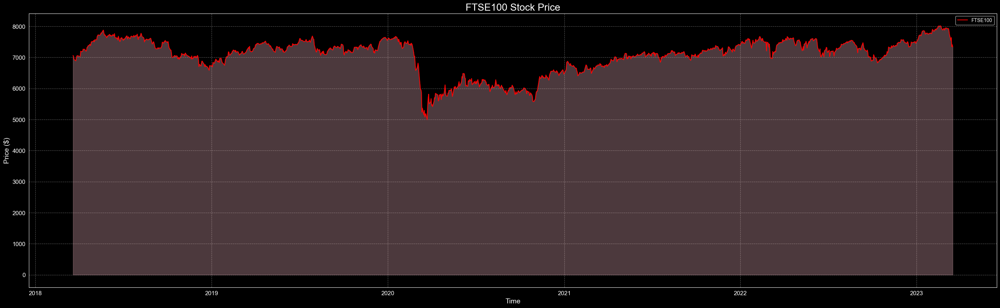

In [74]:
plt.style.use('dark_background')
plt.figure(figsize=(35,10))
plt.plot(stock3.index, stock3['Close'], label='FTSE100', color="red")
plt.fill_between(stock3.index, stock3['Close'], 0, alpha=0.3,color='pink')
plt.title('FTSE100 Stock Price', fontsize=20, color="White")
plt.xlabel("Time", fontsize=14)
plt.ylabel("Price ($)", fontsize=14)
plt.legend(loc='best')
plt.tick_params(axis="both", labelsize=12)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

## SKLEARN LINEAR REGRESSION 

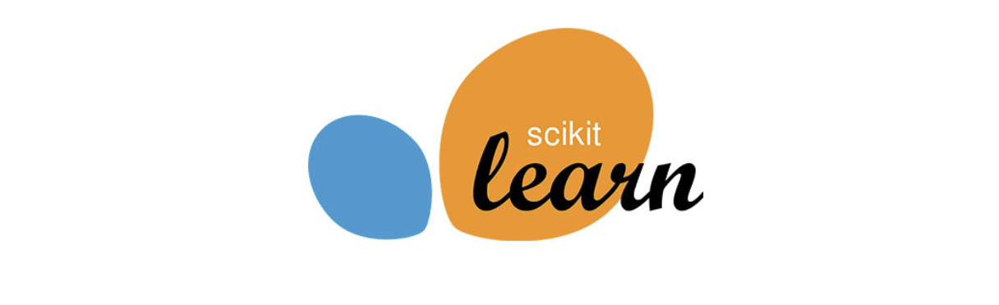

In [75]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from datetime import datetime

### PRICE ANALYSIS

#### TEN YEAR TIME SERIES ANALYSIS

In [76]:
cs = yf.Ticker("CS")
data = cs.history(period="10y")

In [77]:
data['Date_ordinal'] = [datetime.toordinal(d) for d in data.index]
X_train, X_test, y_train, y_test = train_test_split(data['Date_ordinal'].values.reshape(-1, 1), data['Close'], test_size=0.2, random_state=0)

In [78]:
# Create a linear regression model
model = LinearRegression()

In [79]:
# Train the model
model.fit(X_train, y_train)

LinearRegression()

In [80]:
# Predict the values
y_pred = model.predict(X_test)

In [81]:
# Convert ordinal value back to date
X_test = [datetime.fromordinal(int(d)) for d in X_test.flatten()]

In [82]:
model.intercept_

3305.8853709544296

In [83]:
model.coef_

array([-0.00446831])

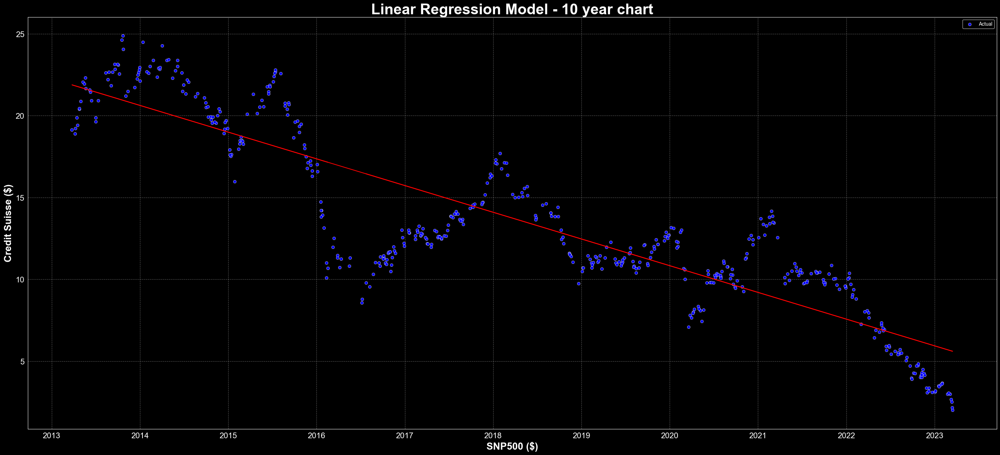

In [84]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
sns.scatterplot(x=X_test, y=y_test, label='Actual', color='blue')
plt.plot(X_test, y_pred, label='Predicted', color='red')
plt.title('Linear Regression Model - 10 year chart', fontsize=30, color="White", fontweight='bold')
plt.xlabel("SNP500 ($)", fontsize=20, fontweight='bold')
plt.ylabel("Credit Suisse ($)", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

#### FIVE YEAR TIME SERIES ANALYSIS

In [85]:
cs = yf.Ticker("CS")
data = cs.history(period="5y")

In [86]:
data['Date_ordinal'] = [datetime.toordinal(d) for d in data.index]
X_train, X_test, y_train, y_test = train_test_split(data['Date_ordinal'].values.reshape(-1, 1), data['Close'], test_size=0.2, random_state=0)

In [87]:
# Create a linear regression model
model = LinearRegression()

In [88]:
# Train the model
model.fit(X_train, y_train)

LinearRegression()

In [89]:
# Predict the values
y_pred = model.predict(X_test)

In [90]:
# Convert ordinal value back to date
X_test = [datetime.fromordinal(int(d)) for d in X_test.flatten()]

In [91]:
model.intercept_

3590.136781227892

In [92]:
model.coef_

array([-0.00485323])

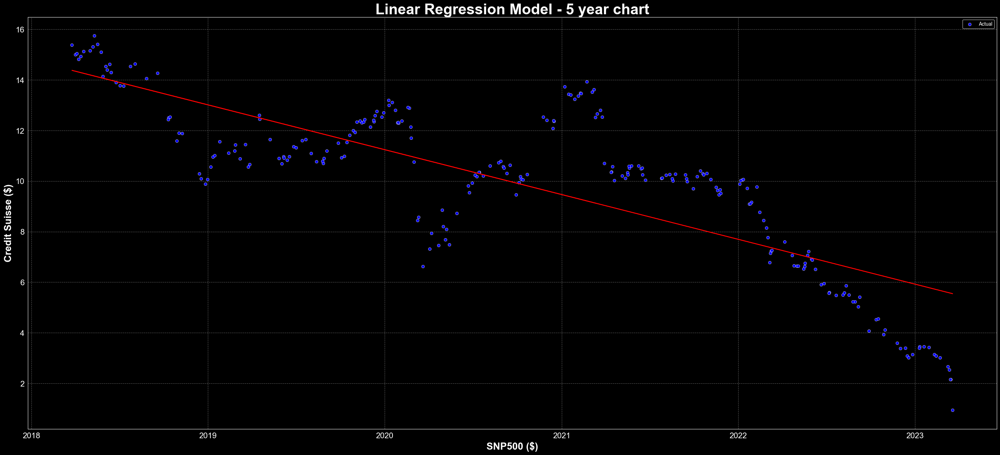

In [93]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
sns.scatterplot(x=X_test, y=y_test, label='Actual', color='blue')
plt.plot(X_test, y_pred, label='Predicted', color='red')
plt.title('Linear Regression Model - 5 year chart', fontsize=30, color="White", fontweight='bold')
plt.xlabel("SNP500 ($)", fontsize=20, fontweight='bold')
plt.ylabel("Credit Suisse ($)", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

#### ONE YEAR TIME SERIES ANALYSIS

In [94]:
cs = yf.Ticker("CS")
data = cs.history(period="1y")

In [95]:
data['Date_ordinal'] = [datetime.toordinal(d) for d in data.index]
X_train, X_test, y_train, y_test = train_test_split(data['Date_ordinal'].values.reshape(-1, 1), data['Close'], test_size=0.2, random_state=0)

In [96]:
# Create a linear regression model
model = LinearRegression()

In [97]:
# Train the model
model.fit(X_train, y_train)

LinearRegression()

In [98]:
# Predict the values
y_pred = model.predict(X_test)

In [99]:
# Convert ordinal value back to date
X_test = [datetime.fromordinal(int(d)) for d in X_test.flatten()]

In [100]:
model.intercept_

10556.524039165188

In [101]:
model.coef_

array([-0.01428951])

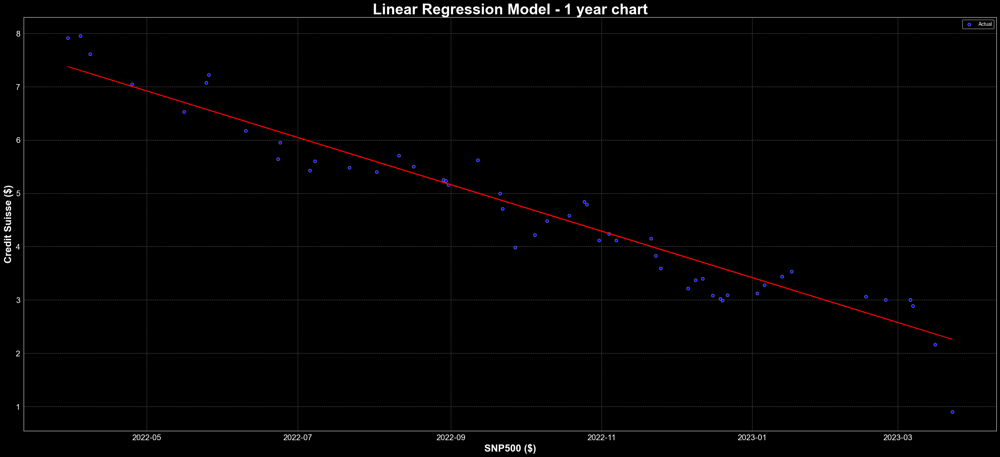

In [102]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
sns.scatterplot(x=X_test, y=y_test, label='Actual', color='blue')
plt.plot(X_test, y_pred, label='Predicted', color='red')
plt.title('Linear Regression Model - 1 year chart', fontsize=30, color="White", fontweight='bold')
plt.xlabel("SNP500 ($)", fontsize=20, fontweight='bold')
plt.ylabel("Credit Suisse ($)", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

### VOLUME ANALYSIS 

In [103]:
cs = yf.Ticker("CS")
data = cs.history(period="max")

In [104]:
data['Date_ordinal'] = [datetime.toordinal(d) for d in data.index]
X_train, X_test, y_train, y_test = train_test_split(data['Date_ordinal'].values.reshape(-1, 1), data['Volume'], test_size=0.2, random_state=0)

In [105]:
# Create a linear regression model
model = LinearRegression()

In [106]:
# Train the model
model.fit(X_train, y_train)

LinearRegression()

In [107]:
# Predict the values
y_pred = model.predict(X_test)

In [108]:
# Convert ordinal value back to date
X_test = [datetime.fromordinal(int(d)) for d in X_test.flatten()]

In [109]:
from matplotlib.ticker import FuncFormatter

In [110]:
model.intercept_

-640596926.3429452

In [111]:
model.coef_

array([876.33934481])

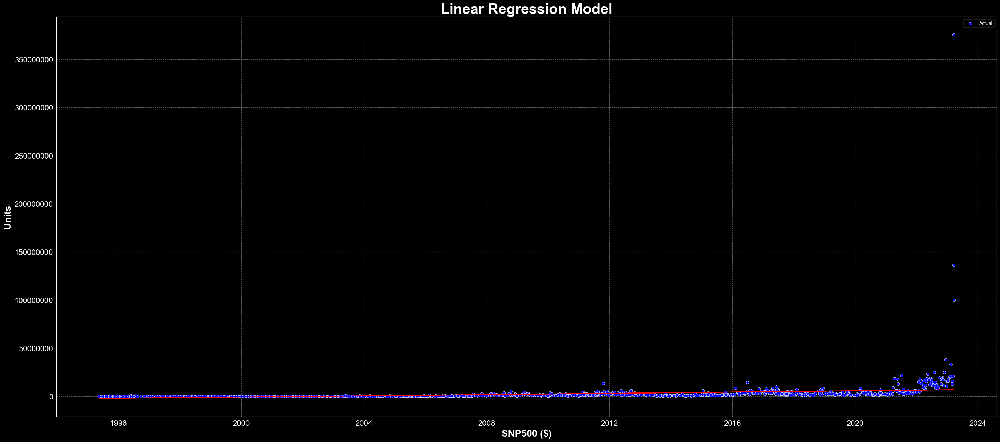

In [112]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x)))
sns.scatterplot(x=X_test, y=y_test, label='Actual', color='blue')
plt.plot(X_test, y_pred, label='Predicted', color='red')
plt.title('Linear Regression Model', fontsize=30, color="White", fontweight='bold')
plt.xlabel("SNP500 ($)", fontsize=20, fontweight='bold')
plt.ylabel("Units", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

### SNP500 & CREDIT SUISSE

#### A common approach is to use between 1 to 5 years of historical data to train a linear regression model for stock market prediction. It is important to note that linear regression may not be the most appropriate model for predicting the stock market, as it assumes a linear relationship between the predictors and the target variable, which may not always hold in the complex and dynamic stock market. Linear regression using Machine Learning Library stills show price is moving into downwards directions. 

THE UNITS ARE IN  DOLLARS FOR SNP500 & CREDIT SUISSE

In [113]:
credit_suisse = yf.Ticker("CS").history(period="5y")
snp500 = yf.Ticker("^GSPC").history(period="5y")

In [114]:
# Preprocess the data by extracting the "Close" prices for Credit Suisse and the S&P 500 and reshaping the S&P 500 data to have a shape of (-1, 1)
y = credit_suisse["Close"].values
x = snp500["Close"].values.reshape(-1, 1)

In [115]:
#Linear Regression Model
model_reg = LinearRegression()
model_reg

LinearRegression()

In [116]:
#Training Model
model_reg.fit(x,y)

LinearRegression()

In [117]:
pred_y = model_reg.predict(x)

In [118]:
pred_y.shape

(1259,)

In [119]:
model_reg.coef_

array([-0.00218003])

In [120]:
model_reg.intercept_

17.63385085311349

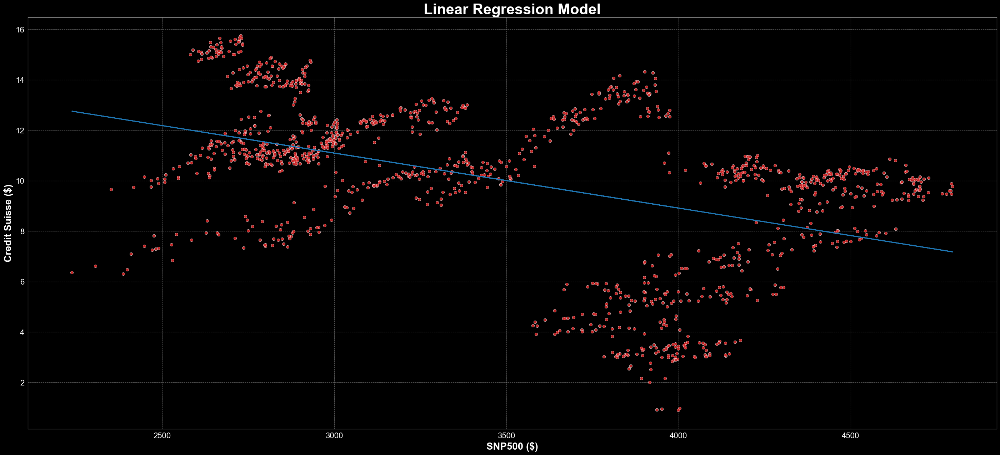

In [121]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
sns.scatterplot(x=x.flatten(), y=y.flatten(), color='tab:red', alpha=0.9)
plt.plot(x, pred_y, color='tab:blue', linewidth=2)
plt.title('Linear Regression Model', fontsize=30, color="White", fontweight='bold')
plt.xlabel("SNP500 ($)", fontsize=20, fontweight='bold')
plt.ylabel("Credit Suisse ($)", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

In [122]:
from sklearn.metrics import mean_squared_error

In [123]:
mse = mean_squared_error(y, pred_y)
print("Mean squared error:", mse)

Mean squared error: 7.86510066155815


In [124]:
# calculate the mean squared error
mse = np.mean((y - pred_y)**2)
print("Mean Squared Error:", mse)

Mean Squared Error: 7.86510066155815


The mean squared error (MSE) value of 7.777455434440157 is a measure of the average squared differences between the actual values of the Credit Suisse stock prices and the predicted values of the stock prices based on the S&P 500 index.

This indicates that the model used to predict the Credit Suisse stock prices based on the S&P 500 index may have some degree of error or inaccuracy in its predictions. The MSE value of 7.777455434440157 can be used as a reference for evaluating and comparing the performance of other predictive models for the same task.

It's difficult to say whether a mean squared error of 7.777455434440157 is good or bad without more context. Generally, a lower mean squared error indicates that the model is better at making predictions. 

However, what is considered a "good" mean squared error can vary depending on the specific problem and the data being used. It's important to compare the mean squared error of a model to other models and to consider the practical implications of the error.

### FTSE100 & CREDIT SUISSE

THE UNITS ARE IN POUNDS FOR FTSE100 & CREDIT SUISSE

In [164]:
credit_suisse = yf.Ticker("CS").history(period="5y")
ftse100 = yf.Ticker("^FTSE").history(period="5y")

In [165]:
from forex_python.converter import CurrencyRates

In [166]:
c = CurrencyRates()
exchange_rate = c.get_rate('USD', 'GBP')
credit_suisse["Close"] = credit_suisse["Close"] * exchange_rate
credit_suisse["Open"] = credit_suisse["Open"] * exchange_rate
credit_suisse["High"] = credit_suisse["High"] * exchange_rate
credit_suisse["Low"] = credit_suisse["Low"] * exchange_rate

In [167]:
credit_suisse.tail(1)

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2023-03-23 00:00:00-04:00,0.739108,0.740086,0.729651,0.731852,26297619,0.0,0.0


In [168]:
ftse100.tail(1)

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2023-03-23 00:00:00+00:00,7566.839844,7566.839844,7476.129883,7509.939941,0,0.0,0.0


In [169]:
# Preprocess the data by extracting the "Close" prices for Credit Suisse and the S&P 500 and reshaping the S&P 500 data to have a shape of (-1, 1)
y = credit_suisse["Close"].values
x = ftse100["Close"].values.reshape(-1, 1)

In [170]:
y #units are on pounds (credit suisse)

array([12.38434152, 12.54797812, 12.30996025, ...,  0.79079511,
        0.75003247,  0.73185233])

In [171]:
y.shape

(1259,)

In [172]:
x.shape

(1262, 1)

In [173]:
x = x[3:]

In [174]:
x.shape

(1259, 1)

In [175]:
#Linear Regression Model
model_reg = LinearRegression()
model_reg

LinearRegression()

In [176]:
#Training Model
model_reg.fit(x,y)

LinearRegression()

In [177]:
pred_y = model_reg.predict(x)

In [178]:
pred_y.shape

(1259,)

In [183]:
model_reg.intercept_

9.1729719673739

In [184]:
model_reg.coef_

array([-0.00014524])

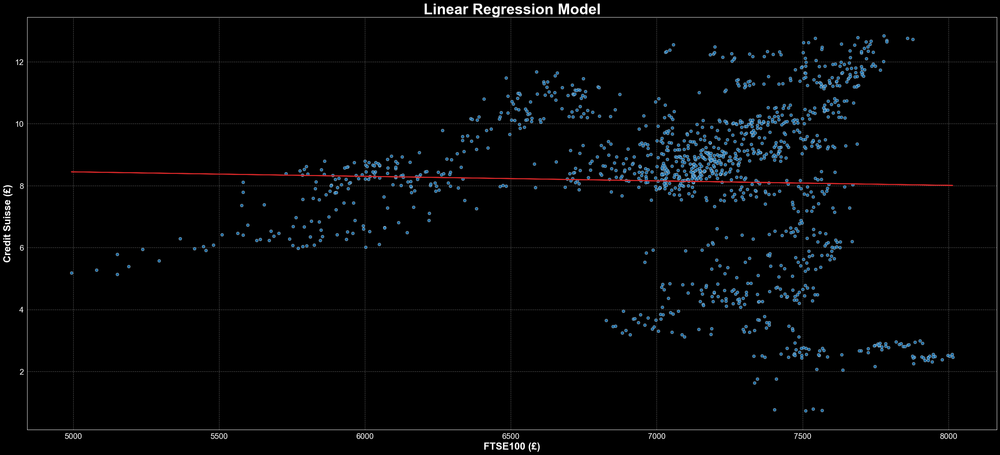

In [185]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
sns.scatterplot(x=x.flatten(), y=y.flatten(), color='tab:blue', alpha=0.9)
plt.plot(x, pred_y, color='tab:red', linewidth=2)
plt.title('Linear Regression Model', fontsize=30, color="White", fontweight='bold')
plt.xlabel("FTSE100 (£)", fontsize=20, fontweight='bold')
plt.ylabel("Credit Suisse (£)", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

In [186]:
mse = mean_squared_error(y, pred_y)
print("Mean squared error:", mse)

Mean squared error: 6.5962661586571025


In [187]:
# calculate the mean squared error
mse = np.mean((y - pred_y)**2)
print("Mean Squared Error:", mse)

Mean Squared Error: 6.5962661586571025


## NEURAL NETWORK REGRESSION

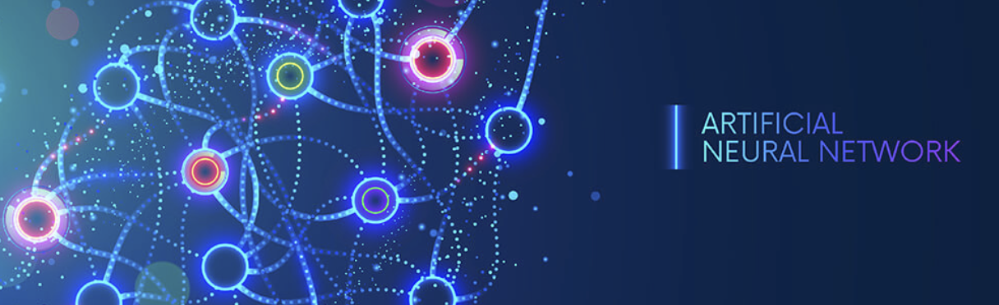

### CREDIT SUISSE & SNP500

In [188]:
credit_suisse = yf.Ticker("CS").history(period="5y")
snp500 = yf.Ticker("^GSPC").history(period="5y")

In [189]:
# Preprocess the data by extracting the "Close" prices for Credit Suisse and the S&P 500 and reshaping the S&P 500 data to have a shape of (-1, 1)
y = credit_suisse["Close"].values
x = snp500["Close"].values.reshape(-1, 1)

In [190]:
# Preprocess the data
print(y.shape)
print(x.shape)

(1259,)
(1259, 1)


In [191]:
from keras.layers import Dense, Dropout

In [192]:
# Define activation and dropout parameters
activation = 'relu'
dropout_rate = 0.2

# Initialize the neural network model
model = Sequential()

# Add layers with specified architecture
for layer_size in [16, 32, 64, 128, 256]:
    model.add(Dense(layer_size, input_shape=(1,), activation=activation))
    model.add(Dropout(dropout_rate))

# Add output layer with linear activation
model.add(Dense(1, activation='linear'))


In [193]:
# Compile the model with the specified loss function and optimizer
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])
# Train the model
model.fit(x, y, epochs=250, batch_size=32, verbose=1)

Epoch 1/250
40/40 [==============================] - 2s 3ms/step - loss: 4271.5767 - mean_squared_error: 4271.5767
Epoch 2/250
40/40 [==============================] - 0s 4ms/step - loss: 830.8483 - mean_squared_error: 830.8483
Epoch 3/250
40/40 [==============================] - 0s 4ms/step - loss: 450.3986 - mean_squared_error: 450.3986
Epoch 4/250
40/40 [==============================] - 0s 4ms/step - loss: 345.8589 - mean_squared_error: 345.8589
Epoch 5/250
40/40 [==============================] - 0s 3ms/step - loss: 263.5330 - mean_squared_error: 263.5330
Epoch 6/250
40/40 [==============================] - 0s 2ms/step - loss: 199.6976 - mean_squared_error: 199.6976
Epoch 7/250
40/40 [==============================] - 0s 3ms/step - loss: 162.9080 - mean_squared_error: 162.9080
Epoch 8/250
40/40 [==============================] - 0s 3ms/step - loss: 138.1876 - mean_squared_error: 138.1876
Epoch 9/250
40/40 [==============================] - 0s 3ms/step - loss: 122.1926 - mean_squar

40/40 [==============================] - 0s 3ms/step - loss: 20.6140 - mean_squared_error: 20.6140
Epoch 75/250
40/40 [==============================] - 0s 2ms/step - loss: 22.8353 - mean_squared_error: 22.8353
Epoch 76/250
40/40 [==============================] - 0s 2ms/step - loss: 20.1809 - mean_squared_error: 20.1809
Epoch 77/250
40/40 [==============================] - 0s 2ms/step - loss: 20.9086 - mean_squared_error: 20.9086
Epoch 78/250
40/40 [==============================] - 0s 2ms/step - loss: 21.3504 - mean_squared_error: 21.3504
Epoch 79/250
40/40 [==============================] - 0s 3ms/step - loss: 20.2097 - mean_squared_error: 20.2097
Epoch 80/250
40/40 [==============================] - 0s 2ms/step - loss: 19.5150 - mean_squared_error: 19.5150
Epoch 81/250
40/40 [==============================] - 0s 3ms/step - loss: 20.2116 - mean_squared_error: 20.2116
Epoch 82/250
40/40 [==============================] - 0s 3ms/step - loss: 19.5466 - mean_squared_error: 19.5466
Epoch

40/40 [==============================] - 0s 3ms/step - loss: 10.4607 - mean_squared_error: 10.4607
Epoch 147/250
40/40 [==============================] - 0s 2ms/step - loss: 11.1075 - mean_squared_error: 11.1075
Epoch 148/250
40/40 [==============================] - 0s 2ms/step - loss: 10.5879 - mean_squared_error: 10.5879
Epoch 149/250
40/40 [==============================] - 0s 2ms/step - loss: 10.5534 - mean_squared_error: 10.5534
Epoch 150/250
40/40 [==============================] - 0s 3ms/step - loss: 10.5928 - mean_squared_error: 10.5928
Epoch 151/250
40/40 [==============================] - 0s 2ms/step - loss: 10.4048 - mean_squared_error: 10.4048
Epoch 152/250
40/40 [==============================] - 0s 2ms/step - loss: 10.3853 - mean_squared_error: 10.3853
Epoch 153/250
40/40 [==============================] - 0s 2ms/step - loss: 10.1185 - mean_squared_error: 10.1185
Epoch 154/250
40/40 [==============================] - 0s 2ms/step - loss: 10.1707 - mean_squared_error: 10.17

40/40 [==============================] - 0s 3ms/step - loss: 9.6440 - mean_squared_error: 9.6440
Epoch 220/250
40/40 [==============================] - 0s 2ms/step - loss: 9.8189 - mean_squared_error: 9.8189
Epoch 221/250
40/40 [==============================] - 0s 2ms/step - loss: 9.5702 - mean_squared_error: 9.5702
Epoch 222/250
40/40 [==============================] - 0s 2ms/step - loss: 9.4774 - mean_squared_error: 9.4774
Epoch 223/250
40/40 [==============================] - 0s 2ms/step - loss: 9.4634 - mean_squared_error: 9.4634
Epoch 224/250
40/40 [==============================] - 0s 2ms/step - loss: 9.3592 - mean_squared_error: 9.3592
Epoch 225/250
40/40 [==============================] - 0s 2ms/step - loss: 9.4037 - mean_squared_error: 9.4037
Epoch 226/250
40/40 [==============================] - 0s 2ms/step - loss: 9.5177 - mean_squared_error: 9.5177
Epoch 227/250
40/40 [==============================] - 0s 2ms/step - loss: 9.2831 - mean_squared_error: 9.2831
Epoch 228/250
4

In [149]:
# Use the trained model to make predictions for the price of Credit Suisse stock based on the price of the S&P 500
pred_y = model.predict(x)

40/40 [==============================] - 0s 1ms/step


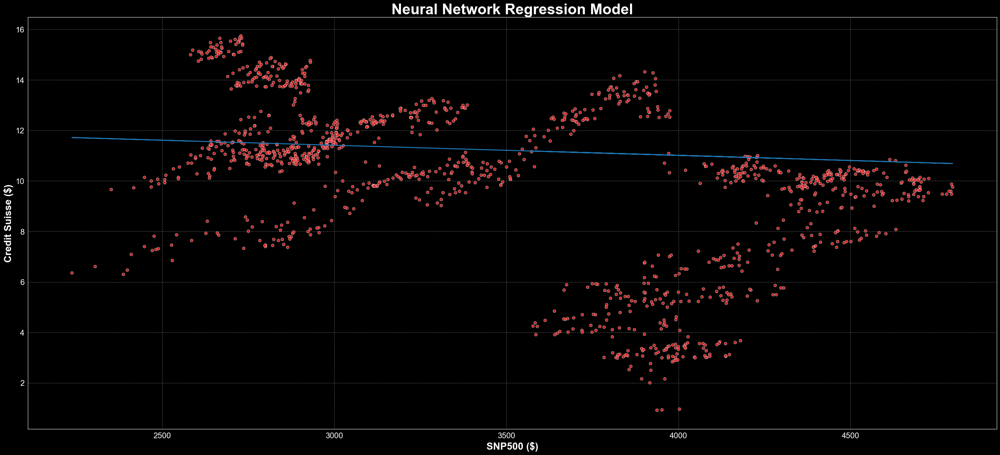

In [150]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
sns.scatterplot(x=x.flatten(), y=y.flatten(), color='tab:red', alpha=0.9)
plt.plot(x, pred_y, color='tab:blue', linewidth=2)
plt.title('Neural Network Regression Model', fontsize=30, color="White", fontweight='bold')
plt.xlabel("SNP500 ($)", fontsize=20, fontweight='bold')
plt.ylabel("Credit Suisse ($)", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()

Neural Network shows slightly little downward correlation between SNP500 and Credit suisse.
neural network model is not the best way to determine if there is a correlation between two variables. A better way to do this is through a correlation analysis or linear regression analysis. 

### CREDIT SUISSE & FTSE100

In [151]:
credit_suisse = yf.Ticker("CS").history(period="5y")
ftse100 = yf.Ticker("^FTSE").history(period="5y")

In [152]:
from forex_python.converter import CurrencyRates

In [153]:
c = CurrencyRates()
exchange_rate = c.get_rate('USD', 'GBP')
credit_suisse["Close"] = credit_suisse["Close"] * exchange_rate
credit_suisse["Open"] = credit_suisse["Open"] * exchange_rate
credit_suisse["High"] = credit_suisse["High"] * exchange_rate
credit_suisse["Low"] = credit_suisse["Low"] * exchange_rate

In [154]:
# Preprocess the data by extracting the "Close" prices for Credit Suisse and the S&P 500 and reshaping the S&P 500 data to have a shape of (-1, 1)
y = credit_suisse["Close"].values
x = ftse100["Close"].values.reshape(-1, 1)

In [155]:
y.shape

(1258,)

In [156]:
x.shape

(1262, 1)

In [157]:
x = x[4:]
x.shape

(1258, 1)

In [158]:
from keras.layers import Dense, Dropout

In [159]:
# Initialize the neural network model
model = Sequential()
model.add(Dense(64, input_shape=(1,), activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='linear'))

In [160]:
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')
# Train the model
model.fit(x, y, epochs=250, batch_size=32, verbose=1)

Epoch 1/250
40/40 [==============================] - 1s 2ms/step - loss: 112108.1875
Epoch 2/250
40/40 [==============================] - 0s 2ms/step - loss: 24145.7812
Epoch 3/250
40/40 [==============================] - 0s 2ms/step - loss: 12658.5410
Epoch 4/250
40/40 [==============================] - 0s 2ms/step - loss: 9162.3779
Epoch 5/250
40/40 [==============================] - 0s 2ms/step - loss: 6844.7734
Epoch 6/250
40/40 [==============================] - 0s 2ms/step - loss: 5425.7324
Epoch 7/250
40/40 [==============================] - 0s 2ms/step - loss: 3857.2588
Epoch 8/250
40/40 [==============================] - 0s 2ms/step - loss: 2906.1746
Epoch 9/250
40/40 [==============================] - 0s 2ms/step - loss: 2298.6489
Epoch 10/250
40/40 [==============================] - 0s 2ms/step - loss: 1898.8218
Epoch 11/250
40/40 [==============================] - 0s 2ms/step - loss: 1353.1500
Epoch 12/250
40/40 [==============================] - 0s 2ms/step - loss: 933.724

In [161]:
# Use the trained model to make predictions for the price of Credit Suisse stock based on the price of the S&P 500
pred_y = model.predict(x)

40/40 [==============================] - 0s 1ms/step


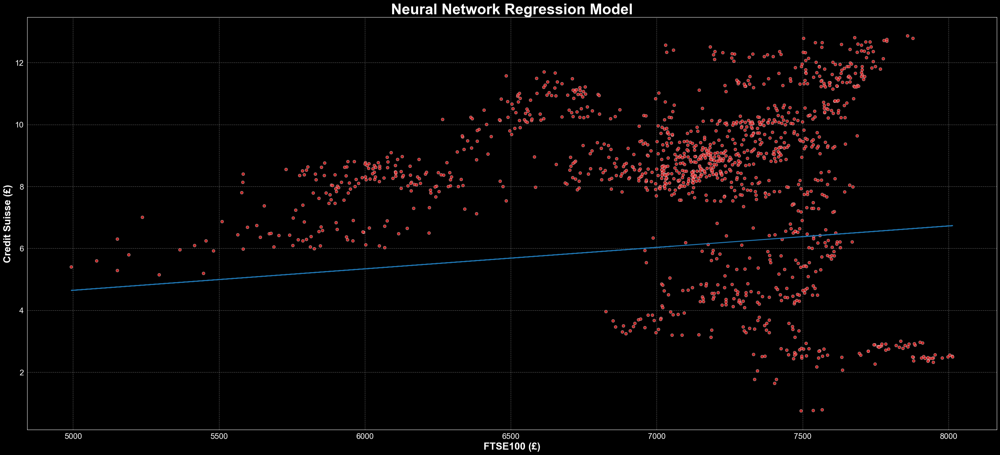

In [162]:
plt.style.use('dark_background')
plt.figure(figsize=(35,15))
sns.scatterplot(x=x.flatten(), y=y.flatten(), color='tab:red', alpha=0.9)
plt.plot(x, pred_y, color='tab:blue', linewidth=2)
plt.title('Neural Network Regression Model', fontsize=30, color="White", fontweight='bold')
plt.xlabel("FTSE100 (£)", fontsize=20, fontweight='bold')
plt.ylabel("Credit Suisse (£)", fontsize=20, fontweight='bold')
plt.tick_params(axis="both", labelsize=16)
plt.grid(linestyle='--', color='gray', alpha=0.7)
plt.show()